parameters setup

In [1]:
from keras.optimizers import Adam
import numpy as np

np.random.seed(10)
# optimizer - LR and Beta1 are hyper parameters
optimizer = Adam(0.0002,0.5)
# params
noise_dim = 100
batch_size = 16
half_batch_size = int(batch_size/2)
steps_per_epoch = 60000 / batch_size  #3750 = batch_size * steps_per_epoch = epoch size (train size)
epochs = 10
img_rows, img_cols, channels = 28, 28, 1
sparse_dim = img_rows * img_cols * channels
L1_weight = 10   # Loss = data_fidelity + L1_weight * L1_norm
thr_value = 0.1 # x = |x| >= thr_value ? x : 0

create_fc_d = False
cnn_encoder = True
warm_start_discriminator = False # init discriminator by training it *a little bit* as classifier
ovecomplete_d = True
if(ovecomplete_d):
  sparse_dim = img_rows * img_cols * channels * 2
# view if running on GPU and its info
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime → "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Using TensorFlow backend.


Thu Mar 26 10:17:41 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.64.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P0    29W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

import data set + preprocessing

(60000, 784)
(6000, 784)


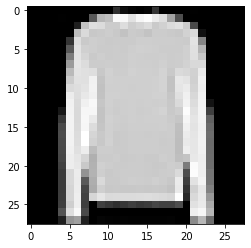

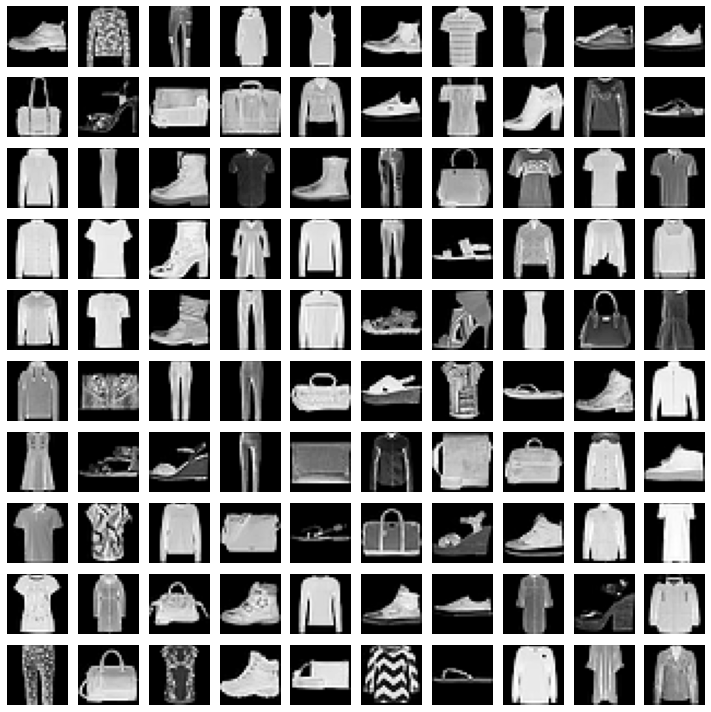

In [2]:
from keras.datasets import mnist, fashion_mnist
from keras.utils import np_utils
import matplotlib.pyplot as plt

use_fashion = True
if(use_fashion):
  (x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()
else: 
  (x_train, y_train), (x_test, y_test) = mnist.load_data()
# transform train and test to range [-1,1]
x_train = (x_train.astype(np.float32) - 127.5) / 127.5
x_test = (x_test.astype(np.float32) - 127.5) / 127.5
plt.imshow(x_train[159,:],cmap="gray")
# create data set of the digit 4
x_four_digit = x_train[y_train==4]
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)

# reshape images as vectors
x_train = x_train.reshape(-1, img_rows*img_cols*channels)
x_four_digit = x_four_digit.reshape(-1, img_rows*img_cols*channels)
x_test = x_test.reshape(-1, img_rows*img_cols*channels)
np.random.shuffle(x_train)
np.random.shuffle(x_four_digit)
print(x_train.shape)
print(x_four_digit.shape)

plt.figure(figsize=(10, 10))
atoms = x_train[0:100,:]
for i, image in enumerate(atoms):
    plt.subplot(10, 10, i+1)
    if channels == 1:
        plt.imshow(image.reshape((img_rows, img_cols)), cmap='gray')
    else:
        plt.imshow(image.reshape((img_rows, img_cols, channels)))
    plt.axis('off')

plt.tight_layout()
plt.show()

Load citionary from csv

In [0]:
  from numpy import loadtxt
  dictionary_loaded2 = loadtxt('dictionary_loaded.csv', delimiter=',')
  dictionary_loaded2 = np.array(dictionary_loaded2,dtype=np.float32) # format that is used in keras
  dictionary_loaded2 = np.transpose(dictionary_loaded2)

Load dictionary from pickle file

In [3]:
import matplotlib.pyplot as plt
from sklearn.decomposition import DictionaryLearning
import pickle
import os.path
from os import path

#dictionary file name
if(use_fashion):
  if(ovecomplete_d):
    file_name = 'dictionary_fashion_mnist_overcomplete'
  else:
    file_name = 'dictionary_fashion_mnist_20'
else:
  if(ovecomplete_d):
    file_name = 'dictionary_mnist_overcomplete'
  else:
    file_name = 'dictionary20.pkl'

#check if dictionary exists
if not path.exists(file_name):
  
  d=DictionaryLearning(n_components=sparse_dim, max_iter=10)
  # train dictionary
  d.fit(x_train[1:10000, :])
  dictionary_loaded2 = np.transpose(d.components_)
  print(dictionary.shape)

  with open(file_name, 'wb') as output:
    pickle.dump(d, output, pickle.HIGHEST_PROTOCOL)
  print("created new dictionary")

else:
  with open(file_name, 'rb') as input:
    print("loading...")
    d = pickle.load(input)
    dictionary_loaded2 = np.transpose(d.components_)
  # print(d)
  print("loaded dictionary")

loading...
loaded dictionary


/usr/local/lib/python3.6/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator DictionaryLearning from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


visualize dictionary's atoms:

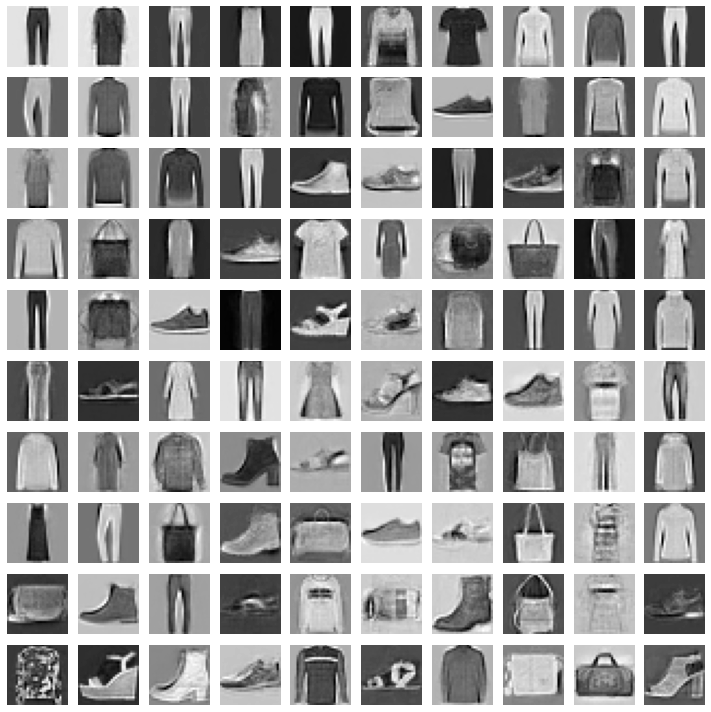

In [4]:
plt.figure(figsize=(10, 10))
atoms = np.transpose(dictionary_loaded2[:,0:100])
for i, image in enumerate(atoms):
    plt.subplot(10, 10, i+1)
    if channels == 1:
        plt.imshow(image.reshape((img_rows, img_cols)), cmap='gray')
    else:
        plt.imshow(image.reshape((img_rows, img_cols, channels)))
    plt.axis('off')

plt.tight_layout()
plt.show()

get transformed data set - the sparse representations of x_train

In [0]:
from numpy import savetxt, loadtxt
if not path.exists('transformed_x.csv'):
  transformed_x = d.transform(x_train)
  transformed_x.shape
  savetxt('transformed_x.csv', transformed_x, delimiter=',')
else:
  transformed_x = loadtxt('transformed_x.csv', delimiter=',')

Create NN modules
*Encoder* :                sparse representation -> noise                                        
*Generator / decoder* :    noise -> vector -> $T_\lambda$(vector) -> mul in dictionary -> Image                        
*Discriminator* :          Image -> real/fake

In [4]:
# with pursuit and thresholding
from keras.utils import plot_model
from keras.models import Sequential
from keras import backend as K
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Model
from keras.initializers import RandomNormal, glorot_uniform
from keras.layers import Input, Dense, Conv2D, Flatten, Reshape, Dropout,AveragePooling2D, MaxPooling2D, BatchNormalization, Lambda, ReLU, Activation
from tensorflow.linalg import matmul, matrix_transpose
from tensorflow.math import abs
from keras import regularizers
from keras.losses import kullback_leibler_divergence, binary_crossentropy
from keras.utils.generic_utils import get_custom_objects
import tensorflow as tf
from tensorflow import cast
from keras.utils import np_utils


# would cause small entries in absulute values to be set to zero and will create sparse vectors
def soft_threshlding(x):
  above_thr_pos = x * cast(x >= thr_value, tf.float32)
  below_thr_neg = x * cast(x <= -thr_value, tf.float32)
  return (above_thr_pos + below_thr_neg)

get_custom_objects().update({'soft_threshlding': Activation(soft_threshlding)})



# classifier
def create_trained_classifier():
    classifier = Sequential()
    #16 - better
    classifier.add(Conv2D(16, (3, 3), strides=(2,2),padding='same', kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02), input_shape=(img_cols, img_rows, channels),name="input"))
    #classifier.add(BatchNormalization(name="BN0"))
    classifier.add(LeakyReLU(0.2,name="Activation0"))
    #32 - better
    classifier.add(Conv2D(32, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="conv1"))
    #classifier.add(BatchNormalization(name="BN1"))
    classifier.add(LeakyReLU(0.2,name="Activation1"))
    # 64 - better
    classifier.add(Conv2D(64, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="conv2"))
    #classifier.add(BatchNormalization(name="BN2"))
    classifier.add(LeakyReLU(0.2,name="Activation2"))
    
    classifier.add(Flatten(name="Flatten"))
    classifier.add(Dropout(0.4,name="dropout"))
    classifier.add(Dense(10, activation='softmax',kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="Dense"))   # 1 number which indicates real / fake
    classifier.trainable = True
    classifier.compile(loss='categorical_crossentropy', optimizer=optimizer)

    model=classifier.fit(x_train.reshape(-1,img_rows,img_cols,channels), y_train, 
                              validation_data=(x_test.reshape(-1,img_rows,img_cols,channels), y_test), epochs=5, batch_size=64)
    return classifier
    
# input: image size
# output: 1 number - 1 real 0 fake
# descriminator:
def create_discriminator():
  if(warm_start_discriminator):
    classifier = create_trained_classifier()
    classifier.pop()
    classifier.add(Dense(1, activation='sigmoid',kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="Dense"))   # 1 number which indicates real / fake
    classifier.compile(loss='binary_crossentropy', optimizer=optimizer)
    return classifier
  else:
    discriminator = Sequential()
    #16
    discriminator.add(Conv2D(16, (3, 3), strides=(2,2),padding='same', kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02), input_shape=(img_cols, img_rows, channels),name="input"))
    discriminator.add(LeakyReLU(0.2,name="Activation0"))
    #32
    discriminator.add(Conv2D(32, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="conv1"))
    discriminator.add(LeakyReLU(0.2,name="Activation1"))
    #64
    discriminator.add(Conv2D(64, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="conv2"))
    discriminator.add(LeakyReLU(0.2,name="Activation2"))
    
    discriminator.add(Flatten(name="Flatten"))
    discriminator.add(Dropout(0.4,name="dropout"))
    discriminator.add(Dense(1, activation='sigmoid',kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="Dense"))   # 1 number which indicates real / fake
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator


def create_fc_descriminator():
    discriminator = Sequential()
     
    discriminator.add(Dense(1024, input_dim=img_rows*img_cols*channels))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Dense(512))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Dense(256))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Dense(1, activation='sigmoid'))
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator



# input: sparse vec size
# output: noise size
def create_encoder():
    reconstructor = Sequential()
    init = RandomNormal(0,stddev=0.02)

    reconstructor.add(Dense(512,  kernel_initializer=init, input_dim=(img_rows*img_cols*channels),name="rec_input"))
    reconstructor.add(BatchNormalization(name="BN0"))
    reconstructor.add(LeakyReLU(0.2,name="activation0"))

    reconstructor.add(Dense(256, kernel_initializer=init,name="hidden1"))
    reconstructor.add(BatchNormalization(name="BN1"))
    reconstructor.add(LeakyReLU(0.2,name="activation1"))

    reconstructor.add(Dense(noise_dim, kernel_initializer=init,name="hidden2"))
    reconstructor.add(BatchNormalization(name="BN2"))
    reconstructor.add(LeakyReLU(0.2,name="activation2"))
    return reconstructor

def create_variational_encoder():
    
    variational_encoder = Sequential()
    init = RandomNormal(0,stddev=0.02)
    if(cnn_encoder):
      variational_encoder.add(Reshape((img_rows, img_cols, channels),input_shape=(img_rows*img_cols*channels,),name="Reshape_as_im"))
      #16
      variational_encoder.add(Conv2D(16, (3, 3), strides=(2,2),padding='same', kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02), input_shape=(img_cols, img_rows, channels),name="input"))
      variational_encoder.add(LeakyReLU(0.2,name="Activation0"))
      #32
      variational_encoder.add(Conv2D(32, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="conv1"))
      variational_encoder.add(LeakyReLU(0.2,name="Activation1"))
      #64
      variational_encoder.add(Conv2D(64, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="conv2"))
      variational_encoder.add(LeakyReLU(0.2,name="Activation2"))
      variational_encoder.add(Flatten(name="Flatten"))
    else:
      variational_encoder.add(Dense(512,  kernel_initializer=init, input_dim=(img_rows*img_cols*channels),name="rec_input"))
      variational_encoder.add(BatchNormalization(name="BN0"))
      variational_encoder.add(LeakyReLU(0.2,name="activation0"))

      variational_encoder.add(Dense(256, kernel_initializer=init,name="hidden1"))
      variational_encoder.add(BatchNormalization(name="BN1"))
      variational_encoder.add(LeakyReLU(0.2,name="activation1"))

    return variational_encoder

# input: noise size
# output: sparse vec size
def create_generator():
    generator = Sequential()
    init = RandomNormal(0,stddev=0.02)
    generator.add(Dense(256, kernel_initializer=init, input_dim=noise_dim,name="init"))
    generator.add(BatchNormalization(name="BN0"))
    generator.add(LeakyReLU(0.2,name="Activation0"))

    generator.add(Dense(512,kernel_initializer=init,name="hidden1"))
    generator.add(BatchNormalization(name="BN1"))
    generator.add(LeakyReLU(0.2,name="Activation1"))

    generator.add(Dense(1024,kernel_initializer=init,name="hidden2"))
    #generator.add(BatchNormalization(name="BN2"))
    generator.add(LeakyReLU(0.2,name="Activation2"))

    # generator.add(Dense(2048,kernel_initializer=init,name="hidden3"))
    # generator.add(BatchNormalization(name="BN3"))
    # generator.add(LeakyReLU(0.2,name="Activation3"))

    generator.add(Dense(sparse_dim, kernel_initializer=init,name="hidden4"))
    # soft thresholding activation
    generator.add(BatchNormalization(name="BN4"))
    generator.add(Activation(soft_threshlding, name='soft_threshlding'))
    return generator

variational_encoder = create_variational_encoder()
generator = create_generator()
encoder = create_encoder()
if(create_fc_d):
  discriminator = create_fc_descriminator()
else:
  discriminator = create_discriminator()
# naming:
generator.name = "Gen"
encoder.name = "Encoder"
discriminator.name = "Disc"
variational_encoder.name = "variational_encoder"
#
variational_encoder.summary()






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "variational_encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Reshape_as_im (Reshape)      (None, 28, 28, 1)         0         
_________________________________________________________________
input (Conv2D)               (None, 14, 14, 16)        160       
_________________________________________________________________
Activation0 (LeakyReLU)      (None, 14, 14, 16)        0         
_________________________________________________________________
conv1 (Conv2D)               (None, 7, 7, 32)          4640      
_________________________________________________________________
Activation1 (LeakyReLU)      (None, 7, 7, 32)          0         
______________________________

create GAN

In [5]:
def create_gan(discriminator, generator):
    discriminator.trainable=False
    gan_input = Input(shape=(noise_dim,))
    # G(z) is a sparse vector
    sparse_vec = generator(gan_input)   # sparse_dim size - it is thresholded
    # a layer that creates the multiplication between the sparse tensor with dictionary to create image
    fake_image_vec = Lambda(lambda x: matrix_transpose(matmul(tf.cast(dictionary_loaded2,tf.float32),matrix_transpose(x))),name='mul_in_D')(sparse_vec)
    # reshape to image size - will be inserted to discriminator
    if(create_fc_d):
      gan_output = discriminator(fake_image_vec)  # the descriminator output
    else:
      fake_image = Reshape((img_rows, img_cols, channels),name="Reshape_as_im")(fake_image_vec)
      gan_output = discriminator(fake_image)  # the descriminator output
    # todo - double output double loss
    gan = Model(gan_input, [gan_output,sparse_vec])
    gan.compile(loss=['binary_crossentropy','mean_absolute_error'], optimizer=optimizer,loss_weights=[1,L1_weight])
    plot_model(gan, to_file='model_plot.png', show_shapes=True, show_layer_names=True,expand_nested=True)
    return gan

gan = create_gan(discriminator,generator)
print(gan.summary())

print(discriminator.summary())
print(discriminator.layers[0].trainable)
print(gan.get_layer(name="Disc").trainable)
print(gan.get_layer(name="Gen").trainable)


Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100)               0         
_________________________________________________________________
Gen (Sequential)             (None, 1568)              2299296   
_________________________________________________________________
mul_in_D (Lambda)            (None, 784)               0         
_________________________________________________________________
Reshape_as_im (Reshape)      (None, 28, 28, 1)         0         
_________________________________________________________________
Disc (Sequential)            (None, 1)                 24321     
Total params: 2,323,617
Trainable params: 2,294,624
Non-trainable params: 28,993
_________________________________________________________________
None
Model: "Disc"
_________________________________________________________________
Layer (type)             

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


create AE module

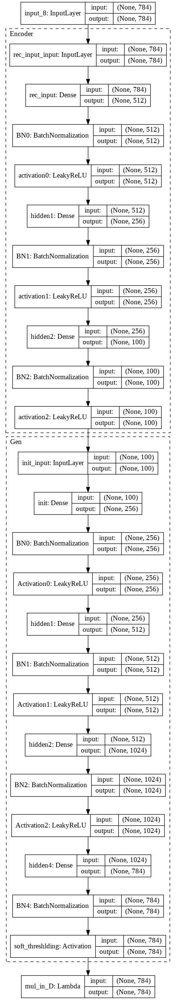

In [0]:
# define ae
vae_input = Input(shape=(sparse_dim,))
encoder_output = encoder(vae_input)
# G(z) is a sparse vector
sparse_vec2 = generator(encoder_output)   # sparse_dim size - it is thresholded
# a layer that creates the multiplication between the sparse tensor with dictionary to create image
fake_image_vec2 = Lambda(lambda x: matrix_transpose(matmul(dictionary_loaded2,matrix_transpose(x))),name='mul_in_D')(sparse_vec2)

#vae = Model(vae_input, [encoder_output, fake_image_vec2])
#vae.compile(loss=[gaussian_prob_loss, 'mean_squared_error'], loss_weights=[0.1,1],optimizer=optimizer)
vae = Model(vae_input, fake_image_vec2)
vae.compile(loss='mean_squared_error',optimizer=optimizer)
plot_model(vae, to_file='model_plot2.png', show_shapes=True, show_layer_names=True,expand_nested=True)

create VAE


Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 784)          0                                            
__________________________________________________________________________________________________
variational_encoder (Sequential (None, 1024)         23296       input_2[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 100)          102500      variational_encoder[1][0]        
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 100)          102500      variational_encoder[1][0]        
___________________________________________________________________________________________

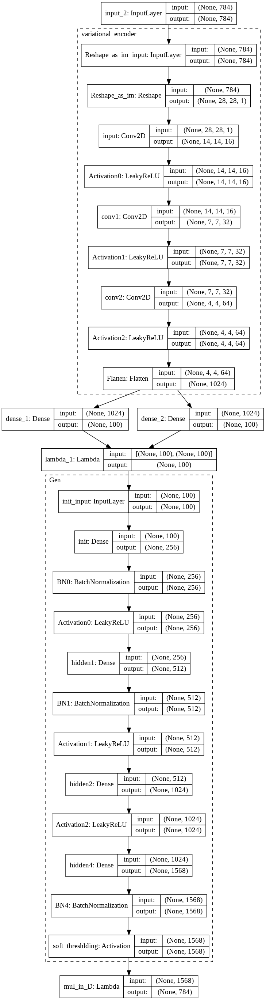

In [6]:
from keras.losses import mse

# add z_mu and z_log_var
variational_autoencoder_input = Input(shape=(img_rows*img_cols*channels,))
variational_encoder_output = variational_encoder(variational_autoencoder_input)
z_mean = Dense(noise_dim)(variational_encoder_output)
z_log_var = Dense(noise_dim)(variational_encoder_output)

# sample from the above to create z: z = z_mu + (eps * z_sigma)
def sampling(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=(batch_size, noise_dim),mean=0., stddev=1.0)
    return z_mean + K.exp(z_log_var) * epsilon

# create z
z = Lambda(sampling, output_shape=(noise_dim,))([z_mean, z_log_var])
# encapsulate encoder
variational_encoder_full = Model(variational_autoencoder_input, [z_mean, z_log_var, z], name='encoder')
variational_encoder_full.summary()
plot_model(variational_encoder_full, to_file='vae_nn_encoder.png', show_shapes=True)


sparse_vec3 = generator(z)
variational_autoencoder_output = Lambda(lambda x: matrix_transpose(matmul(tf.cast(dictionary_loaded2,tf.float32),matrix_transpose(x))),name='mul_in_D')(sparse_vec3)

variational_autoencoder = Model(variational_autoencoder_input, variational_autoencoder_output, name='vae_NN')

# define vae loss
reconstruction_loss = mse(variational_autoencoder_input, variational_autoencoder_output)
reconstruction_loss *= img_cols *img_rows*channels
kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)
# add loss
variational_autoencoder.add_loss(vae_loss)
variational_autoencoder.compile(optimizer='adam')
variational_autoencoder.summary()
plot_model(variational_autoencoder,to_file='vae_mlp.png',show_shapes=True,expand_nested=True)

Train VAE

In [0]:
  # train the autoencoder
  variational_autoencoder.fit(x_train,epochs=15,batch_size=16,validation_data=(x_test, None))
  variational_autoencoder.save_weights('vae_mlp_mnist.h5')




Train on 60000 samples, validate on 10000 samples
Epoch 1/15





60000/60000 [==============================] - 40s 659us/step - loss: 201.4892 - val_loss: 98.9573
Epoch 2/15
60000/60000 [==============================] - 26s 430us/step - loss: 108.5923 - val_loss: 93.5331
Epoch 3/15
60000/60000 [==============================] - 26s 431us/step - loss: 99.0197 - val_loss: 78.6881
Epoch 4/15
60000/60000 [==============================] - 26s 440us/step - loss: 93.2686 - val_loss: 84.7556
Epoch 5/15
60000/60000 [==============================] - 26s 432us/step - loss: 89.2297 - val_loss: 72.9356
Epoch 6/15
60000/60000 [==============================] - 26s 430us/step - loss: 86.2873 - val_loss: 73.2578
Epoch 7/15
60000/60000 [==============================] - 26s 441us/step - loss: 83.3202 - val_loss: 71.6629
Epoch 8/15
60000/60000 [==============================] - 26s 431us/step - loss: 82.2345 - val_loss: 69.1148
Epoch 9/15
60000/60000 [==============================] - 26s 431us/

View results of generating images using G after VAE trainning

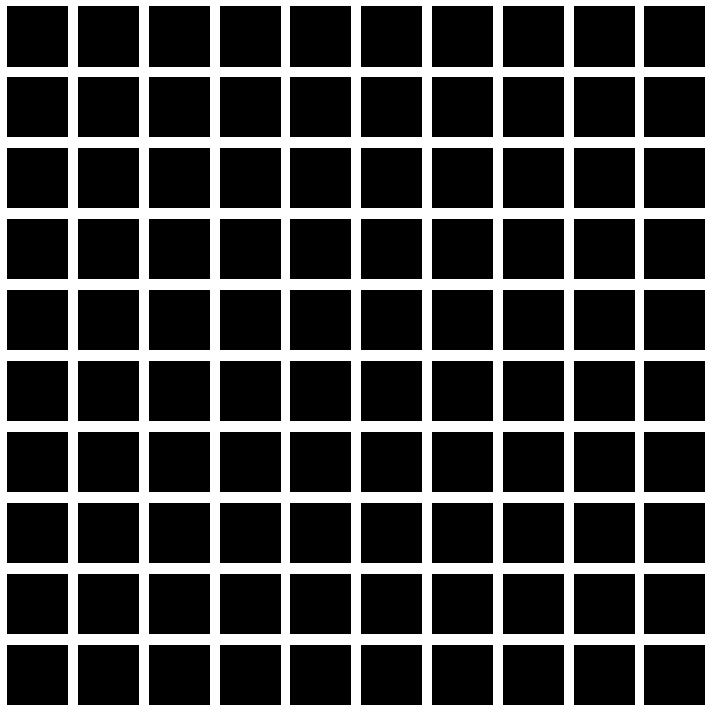

In [8]:
def show_vae_images():
    noise = np.random.normal(0, 1, size=(100, 100))
    generated_images = generator.predict(noise)
    generated_images = np.matmul((dictionary_loaded2),np.transpose(generated_images))
    generated_images = np.transpose(generated_images)
    plt.figure(figsize=(10, 10))
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        if channels == 1:
            plt.imshow(image.reshape((img_rows, img_cols)), cmap='gray')
        else:
            plt.imshow(image.reshape((img_rows, img_cols, channels)))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

show_vae_images()

Train AE sanity check:

In [0]:
# sanity check
from numpy.random import uniform
import time

t = time.time()
zeros = np.zeros(60000*100)
zeros = zeros.reshape(60000,100)
vae.fit(transformed_x,[zeros,x_train],epochs = 20, shuffle=True)
print("elapsed ",time.time()-t)

def show_images2():
    noise = np.random.normal(0, 1, size=(100, 100))
    generated_images = generator.predict(noise)
    generated_images = np.matmul(np.transpose(d.components_),np.transpose(generated_images))
    generated_images = np.transpose(generated_images)
    plt.figure(figsize=(10, 10))
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        if channels == 1:
            plt.imshow(image.reshape((img_rows, img_cols)), cmap='gray')
        else:
            plt.imshow(image.reshape((img_rows, img_cols, channels)))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()



idx = int(uniform(0,59999))

im = np.array(x_train[idx,:])
im = im.reshape(28,28)
plt.imshow(im,cmap="gray")
plt.show()

vae_pred = vae.predict(transformed_x[idx:idx+1,:])[2]
im_r = vae_pred[0].reshape(28,28)
plt.imshow(im_r,cmap="gray")
plt.show()


# gen new data

show_images2()








Epoch 1/20





60000/60000 [==============================] - 30s 500us/step - loss: 0.2838 - Rec_loss: 0.4222 - mul_in_D_loss: 0.2838
Epoch 2/20
60000/60000 [==============================] - 27s 456us/step - loss: 0.1166 - Rec_loss: 0.4273 - mul_in_D_loss: 0.1166
Epoch 3/20
60000/60000 [==============================] - 28s 459us/step - loss: 0.0905 - Rec_loss: 0.4303 - mul_in_D_loss: 0.0905
Epoch 4/20
60000/60000 [==============================] - 27s 451us/step - loss: 0.0774 - Rec_loss: 0.4322 - mul_in_D_loss: 0.0774
Epoch 5/20
60000/60000 [==============================] - 27s 454us/step - loss: 0.0695 - Rec_loss: 0.4326 - mul_in_D_loss: 0.0695
Epoch 6/20
60000/60000 [==============================] - 27s 453us/step - loss: 0.0642 - Rec_loss: 0.4312 - mul_in_D_loss: 0.0642
Epoch 7/20
60000/60000 [==============================] - 27s 457us/step - loss: 0.0604 - Rec_loss: 0.4296 - mul_in_D_loss: 0.0604
Epoch 8/20
51104/60000 [========================>.....] - ETA: 4s - loss: 0

KeyboardInterrupt: ignored

Combined training of Discriminator, Generator and VAE

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


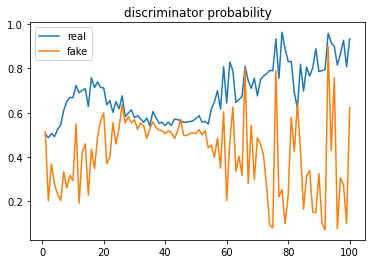

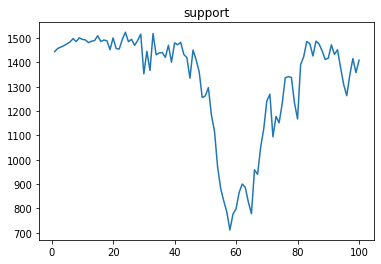

current support  1409.0


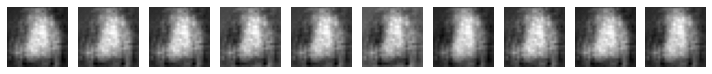

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


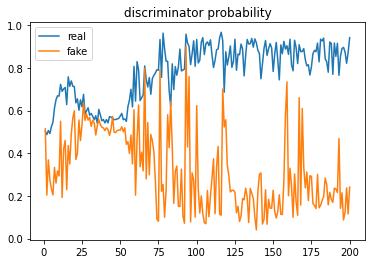

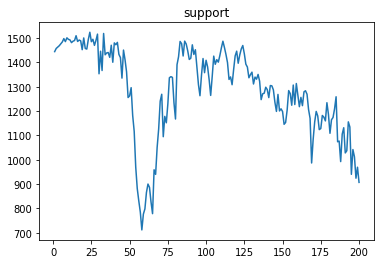

current support  907.25


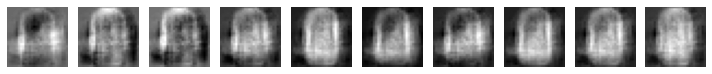

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


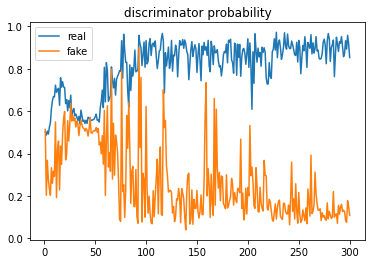

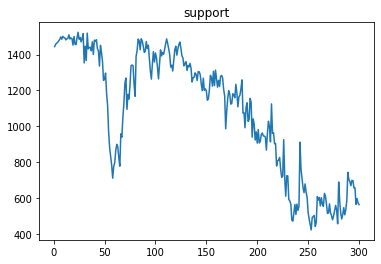

current support  564.9375


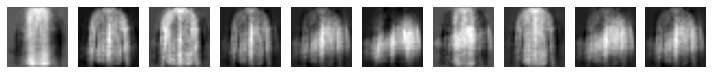

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


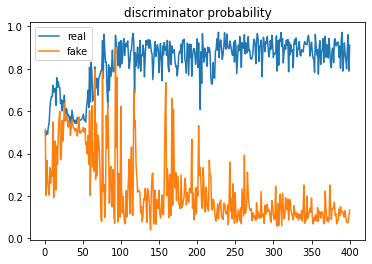

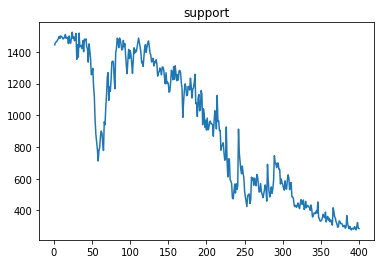

current support  285.375


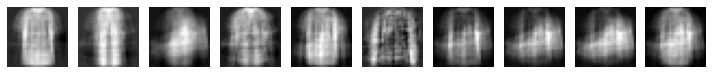

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


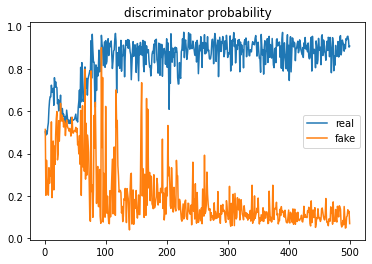

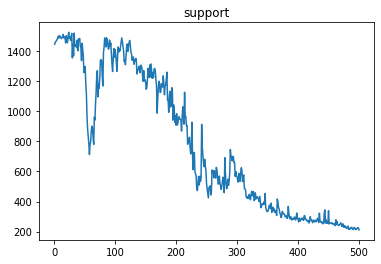

current support  211.3125


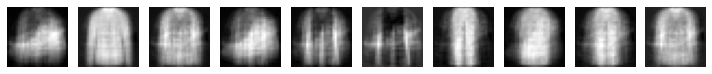

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


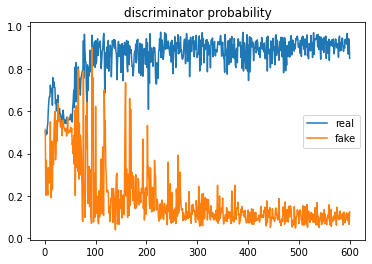

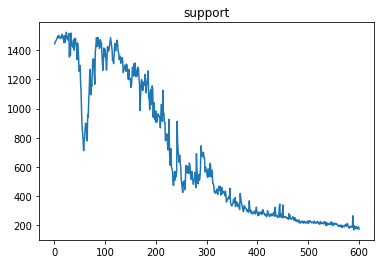

current support  172.6875


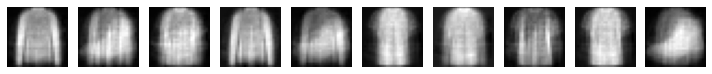

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


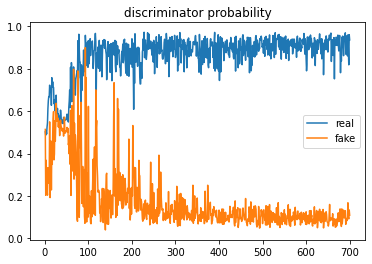

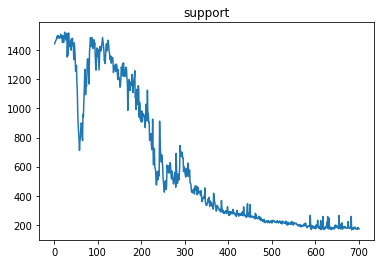

current support  171.5


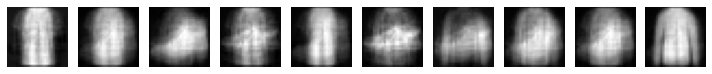

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


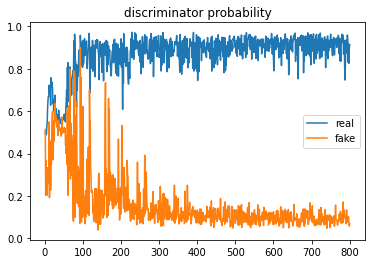

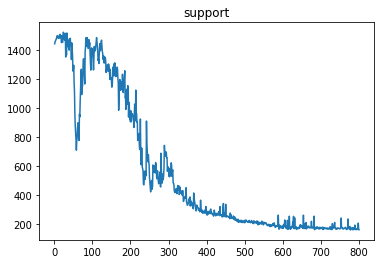

current support  163.5


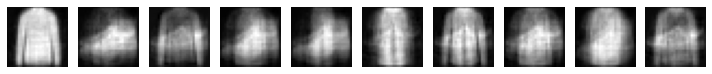

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


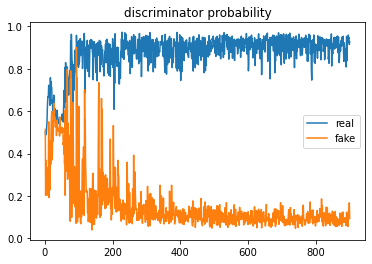

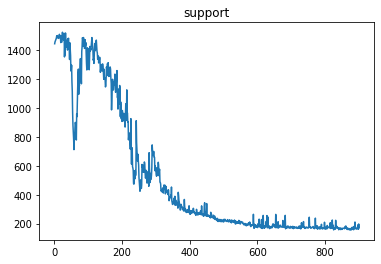

current support  171.375


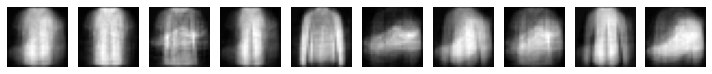

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


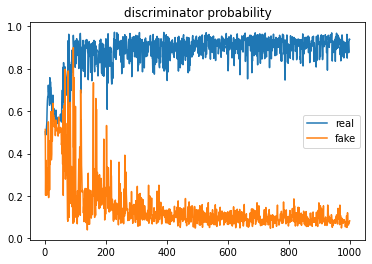

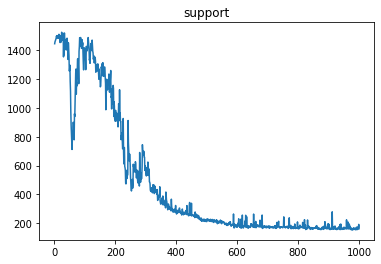

current support  162.25


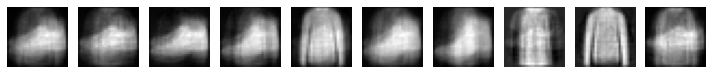

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


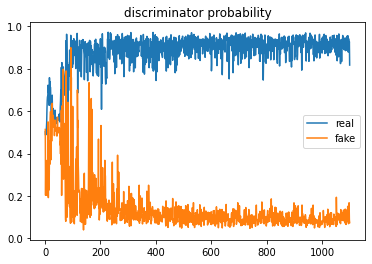

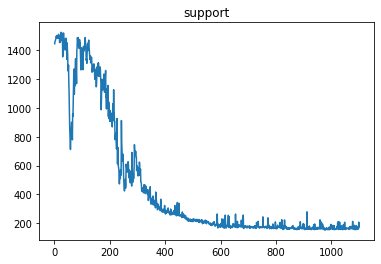

current support  175.1875


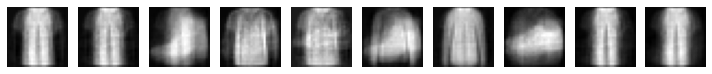

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


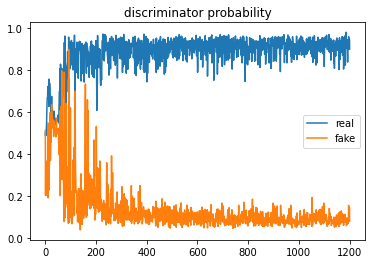

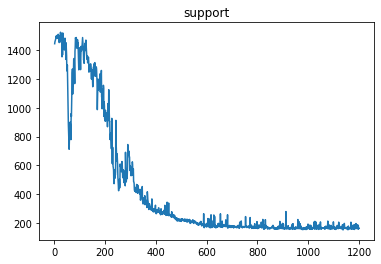

current support  163.3125


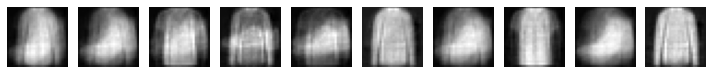

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


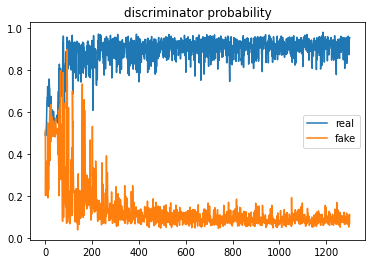

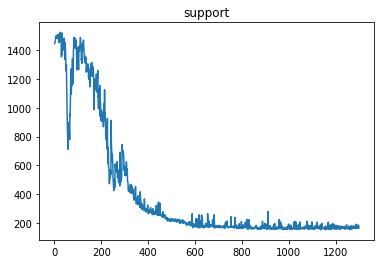

current support  166.1875


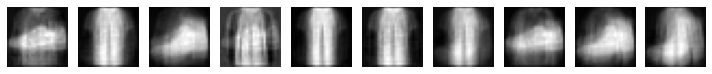

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


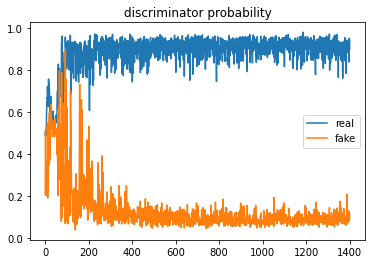

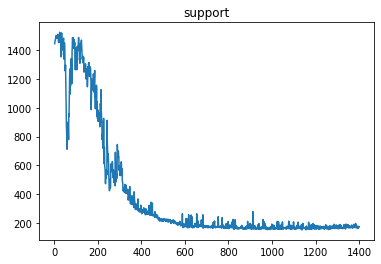

current support  172.6875


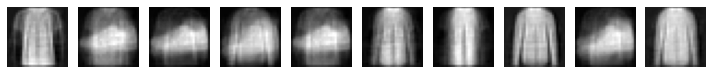

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


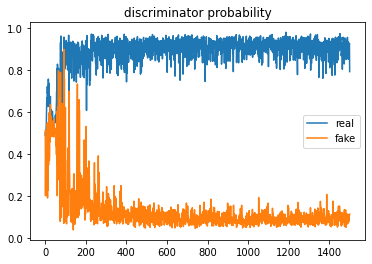

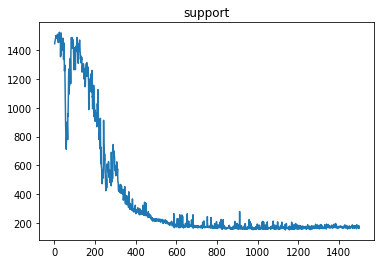

current support  163.1875


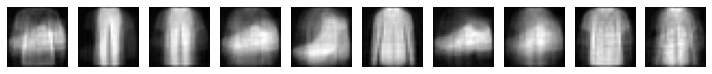

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


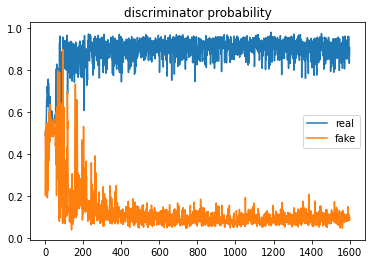

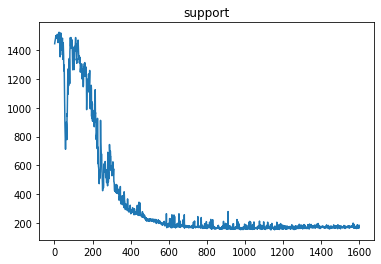

current support  184.0


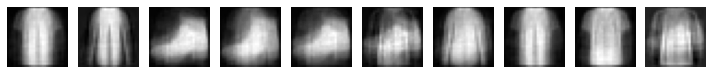

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


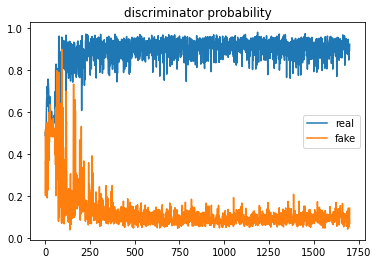

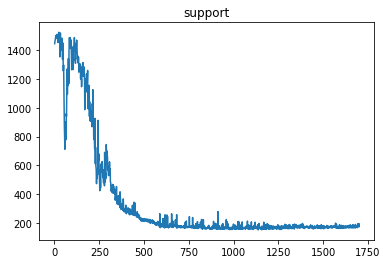

current support  195.3125


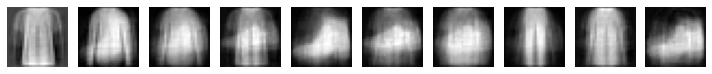

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


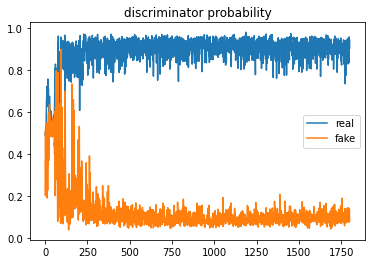

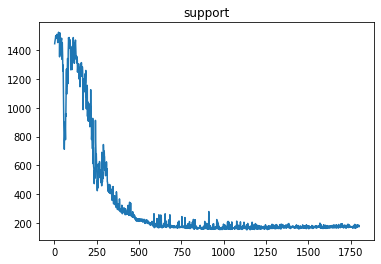

current support  175.1875


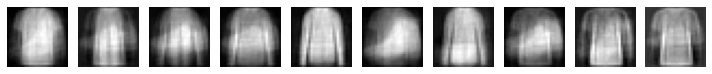

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


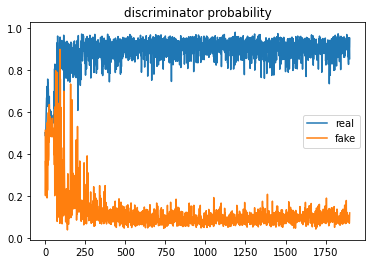

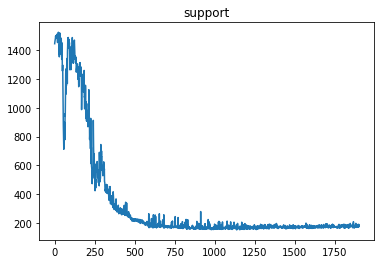

current support  180.625


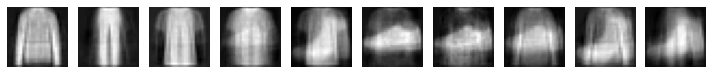

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


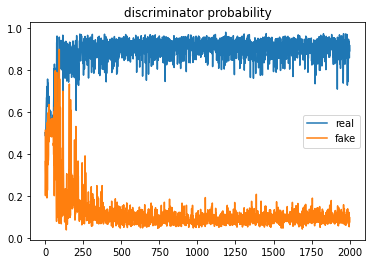

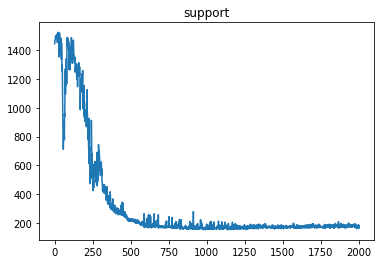

current support  169.3125


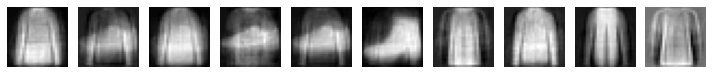

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


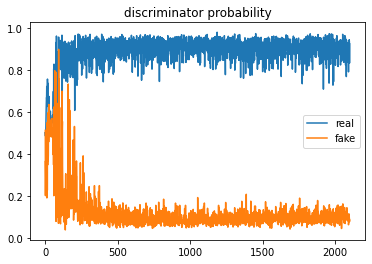

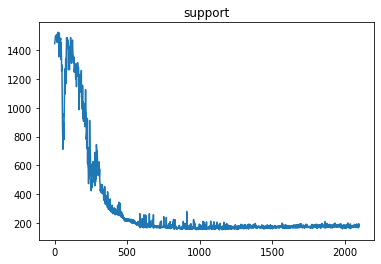

current support  184.9375


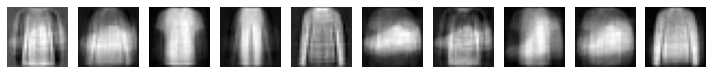

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


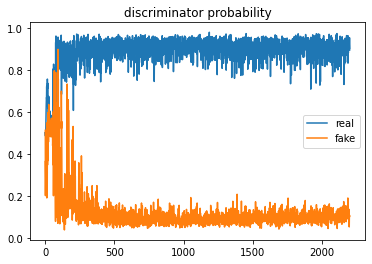

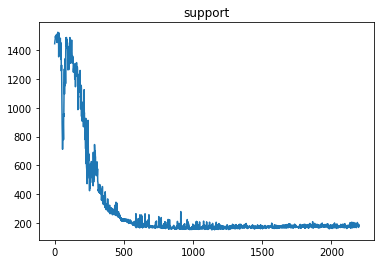

current support  181.3125


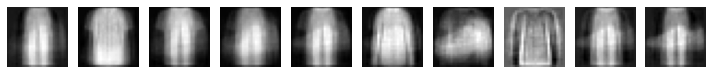

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


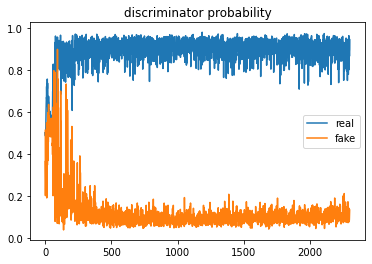

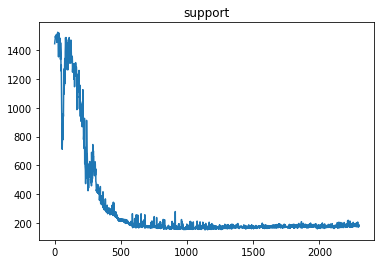

current support  184.6875


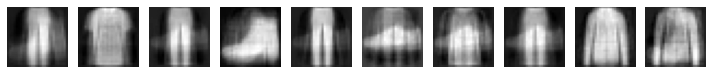

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


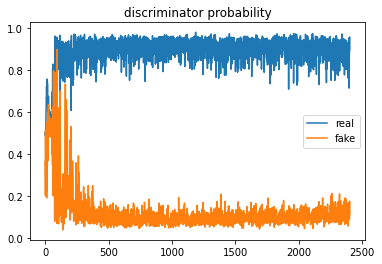

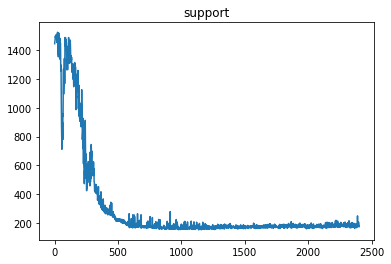

current support  174.6875


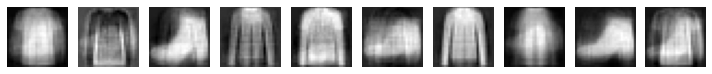

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


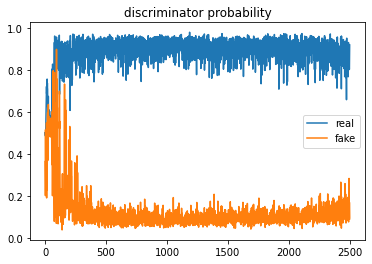

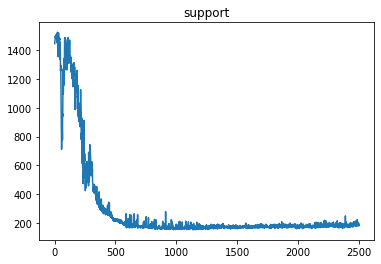

current support  186.5625


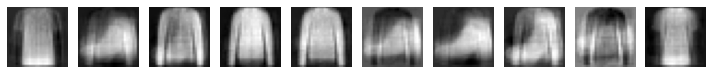

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


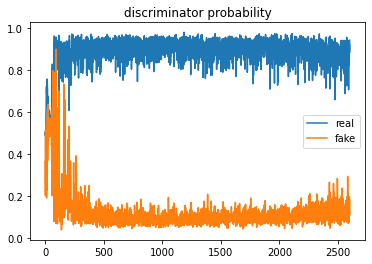

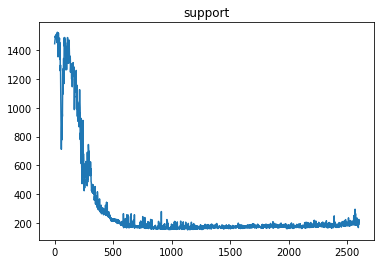

current support  205.875


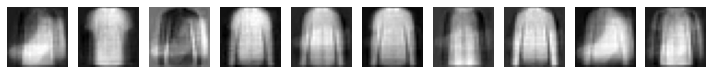

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


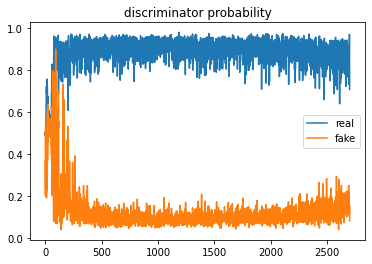

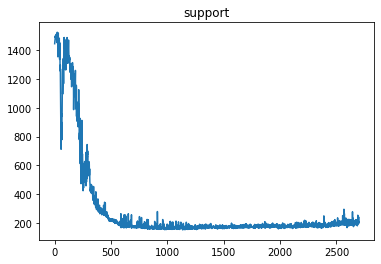

current support  237.9375


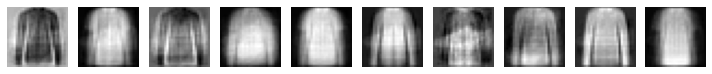

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


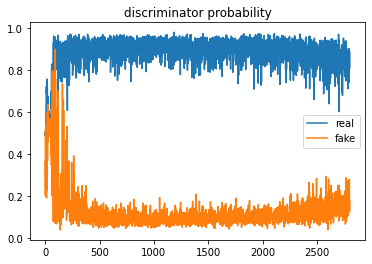

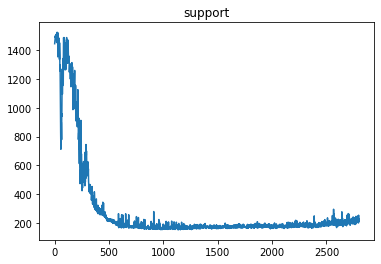

current support  229.5


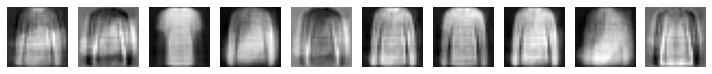

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


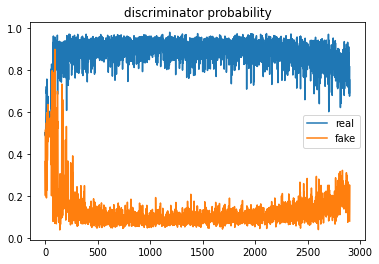

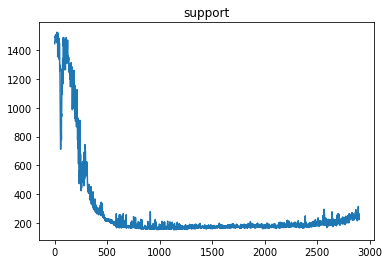

current support  224.0625


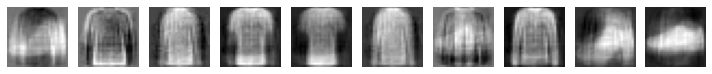

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


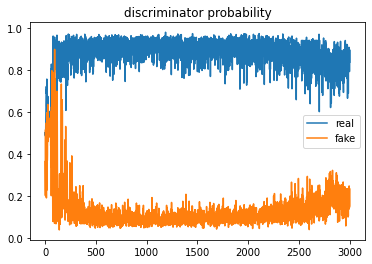

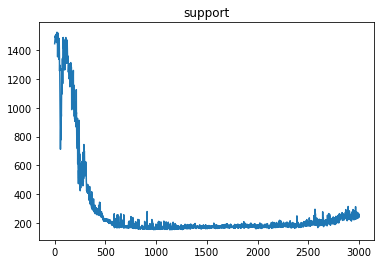

current support  244.1875


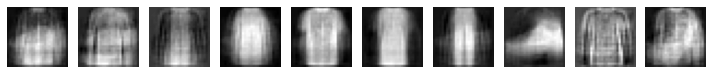

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


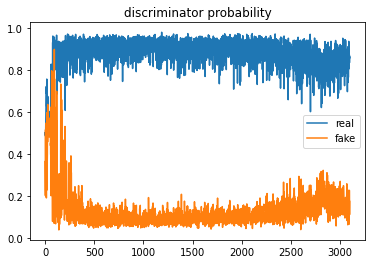

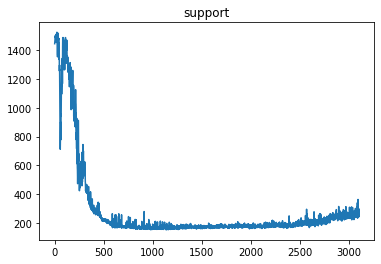

current support  255.25


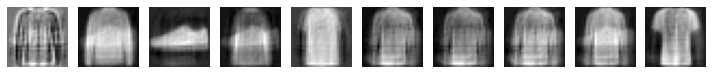

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


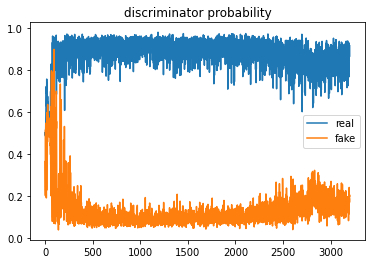

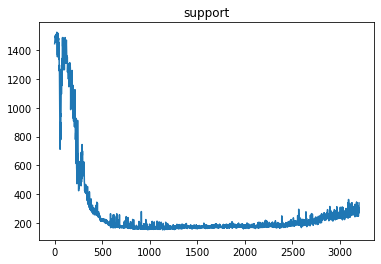

current support  339.5


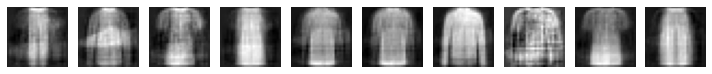

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


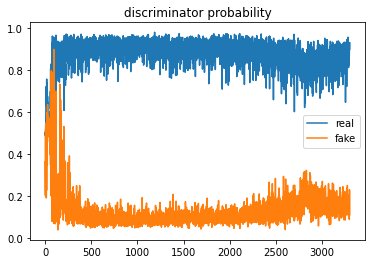

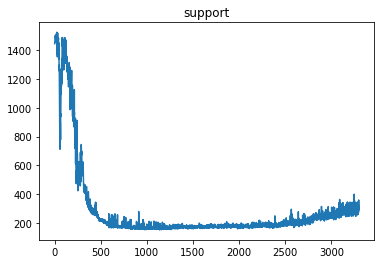

current support  314.875


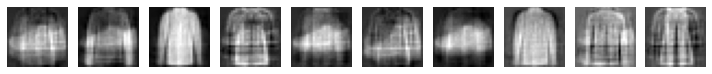

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


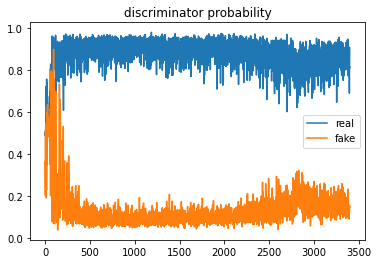

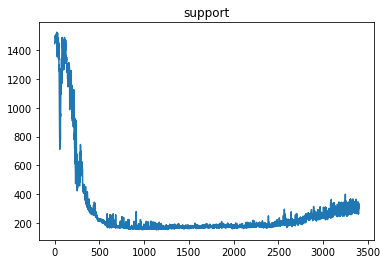

current support  313.0


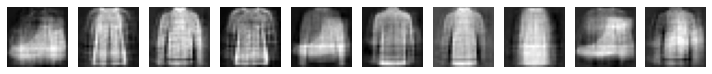

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


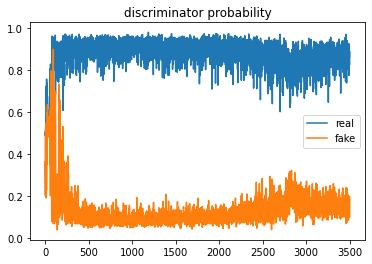

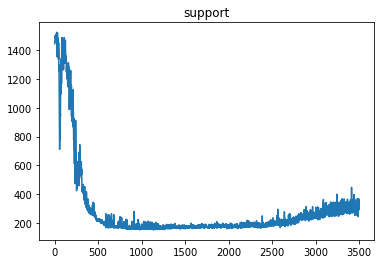

current support  295.8125


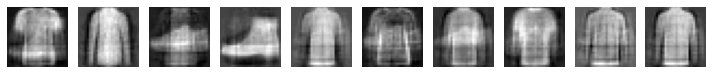

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


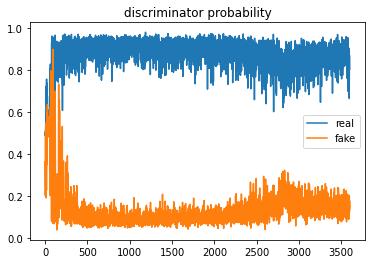

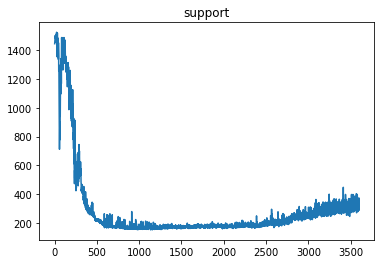

current support  300.875


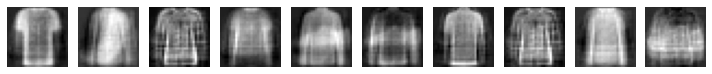

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


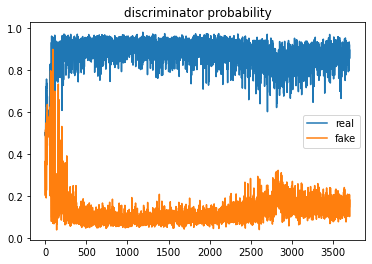

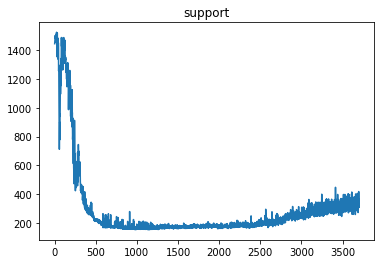

current support  368.25


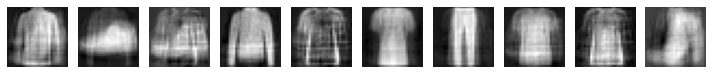

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch: 1 	 Discriminator Loss_fake: 0.4129396677017212 	 Discriminator Loss_real: 0.3803655505180359		 Generator Loss: [1.1339651, 0.35260838, 0.061692804]


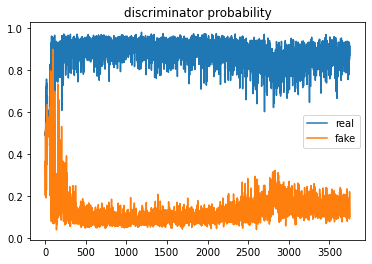

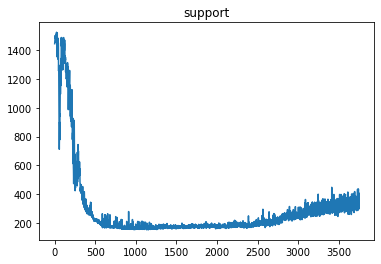

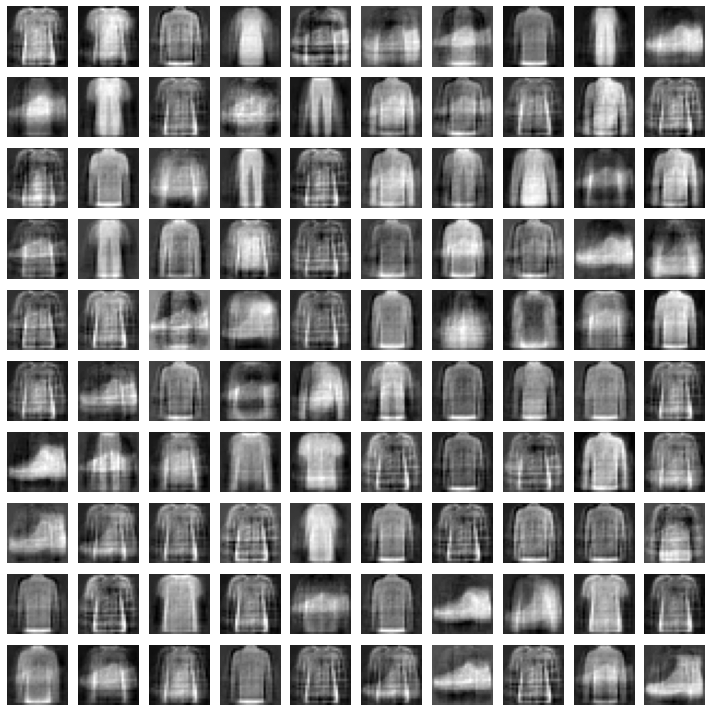

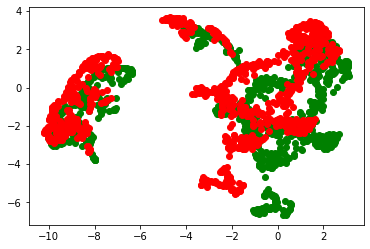

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


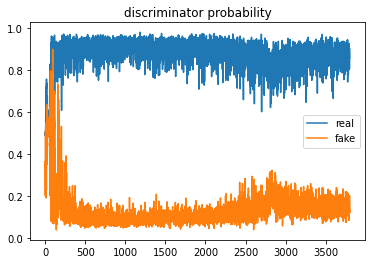

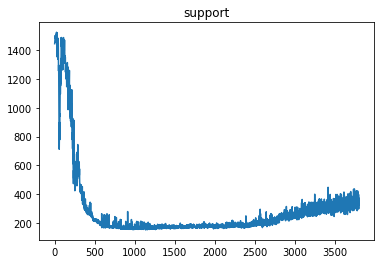

current support  325.5625


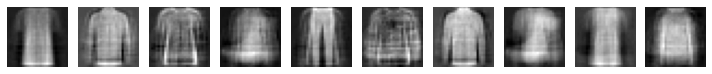

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


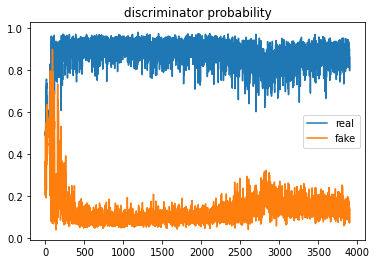

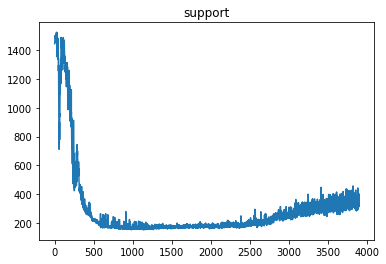

current support  314.9375


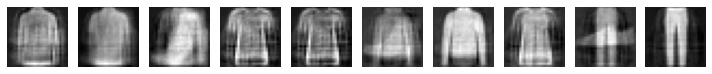

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


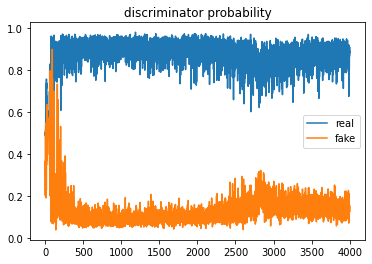

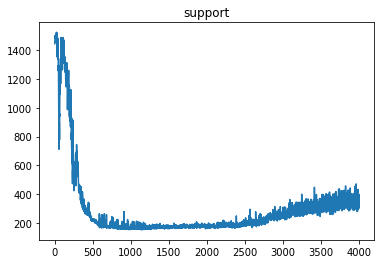

current support  377.6875


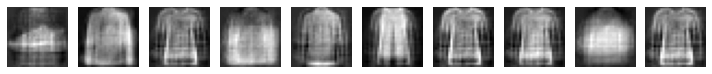

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


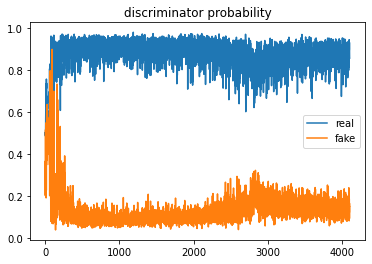

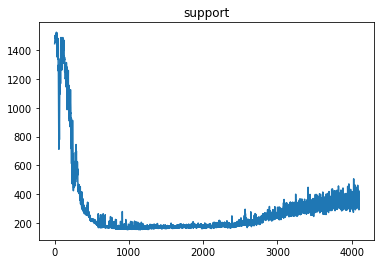

current support  349.4375


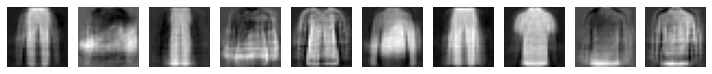

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


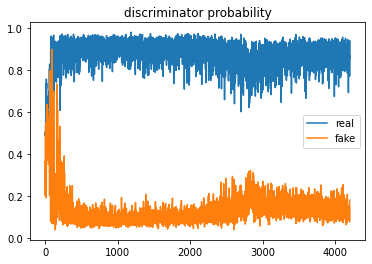

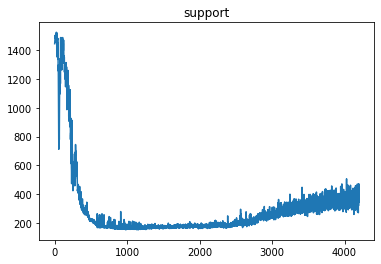

current support  421.875


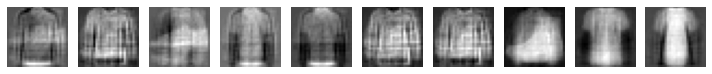

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


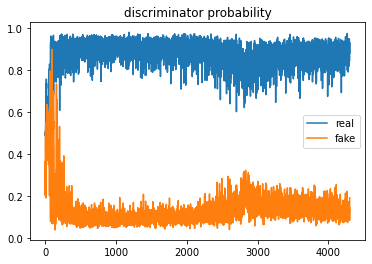

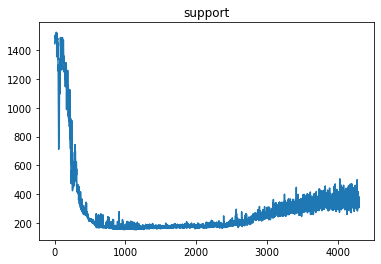

current support  315.125


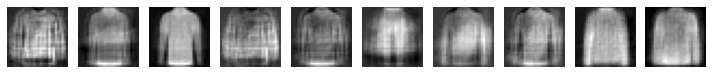

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


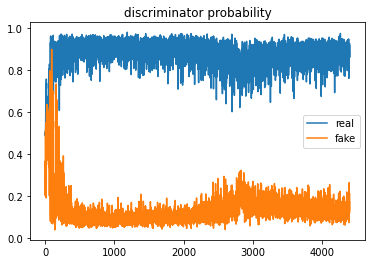

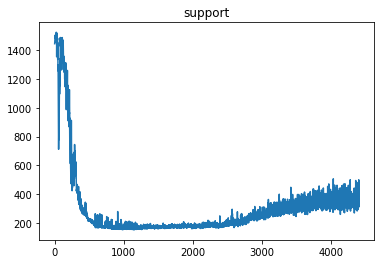

current support  348.875


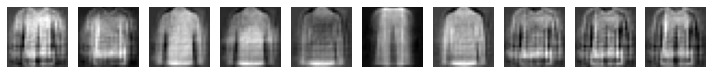

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


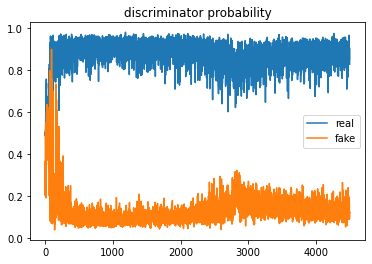

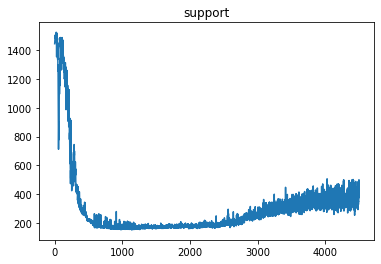

current support  401.4375


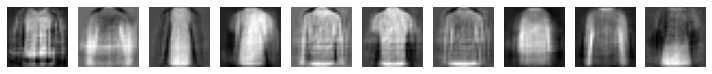

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


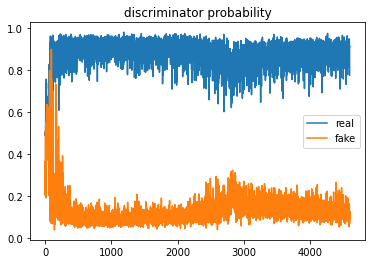

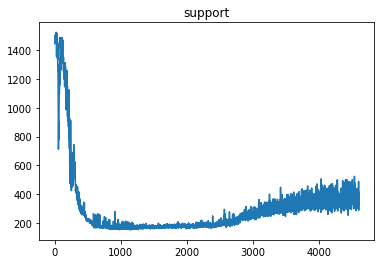

current support  354.4375


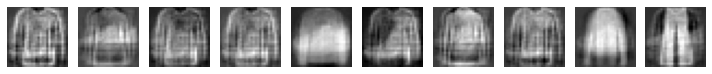

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


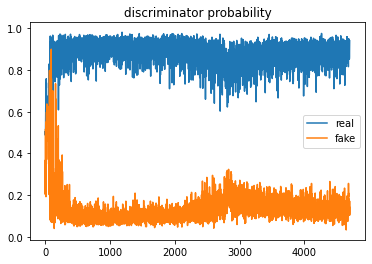

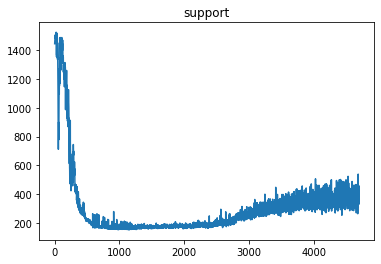

current support  424.4375


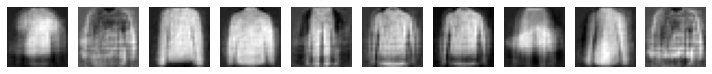

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


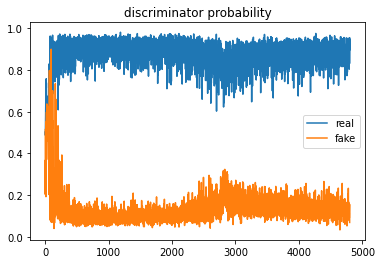

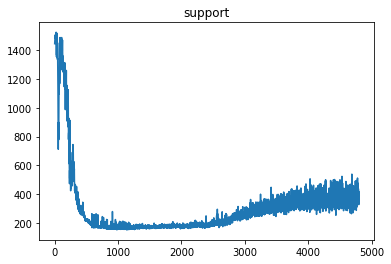

current support  389.75


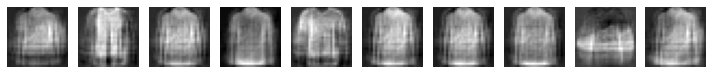

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


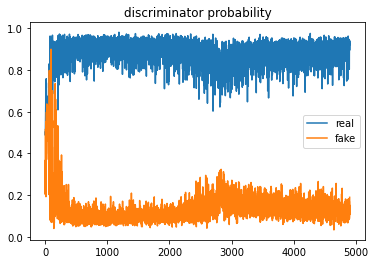

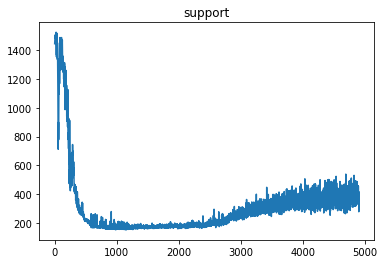

current support  415.375


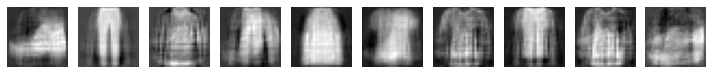

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


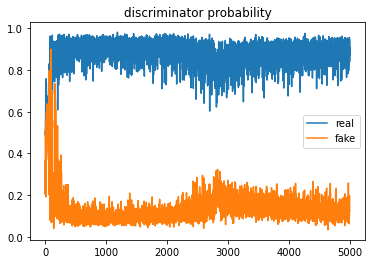

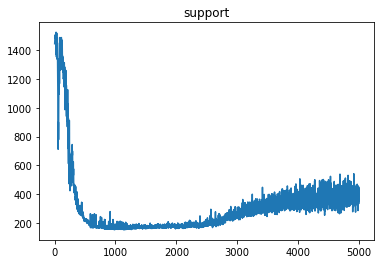

current support  383.625


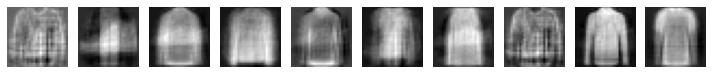

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


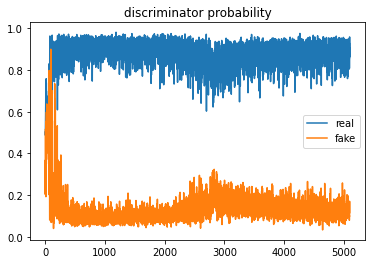

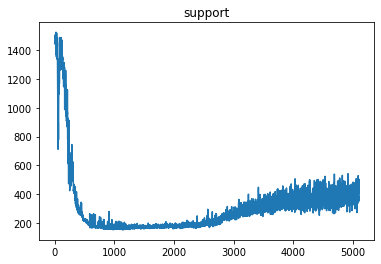

current support  364.25


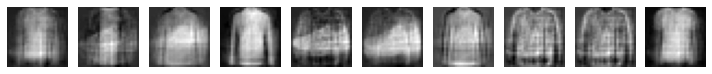

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


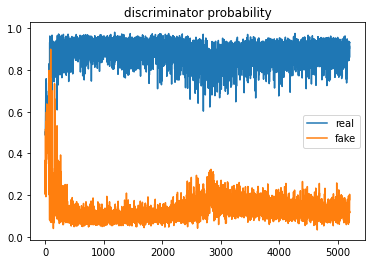

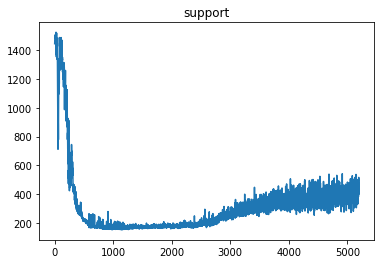

current support  418.5625


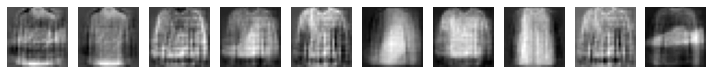

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


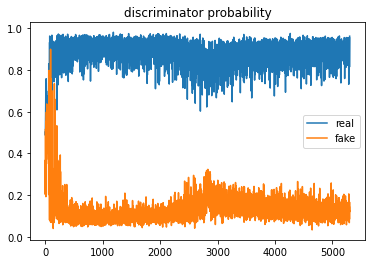

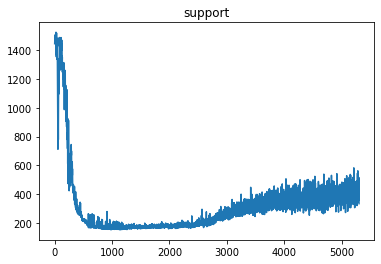

current support  334.5


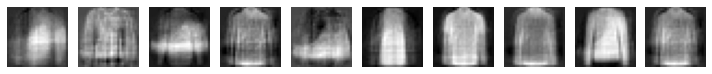

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


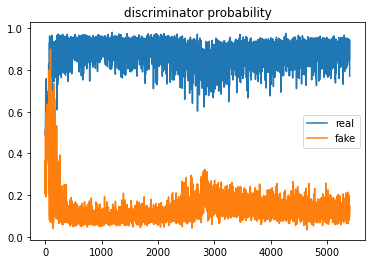

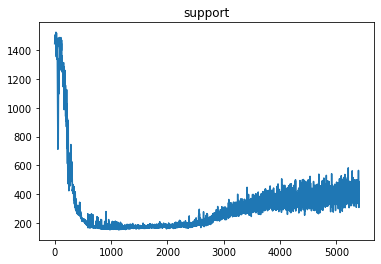

current support  353.8125


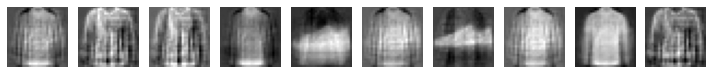

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


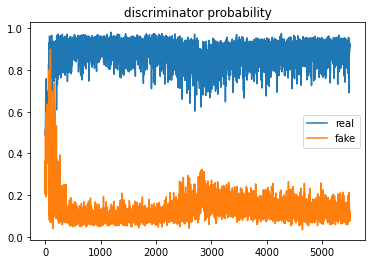

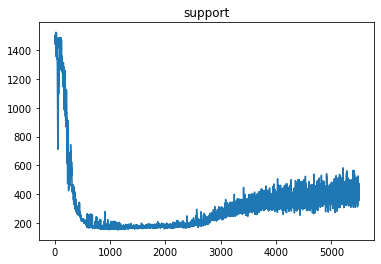

current support  460.25


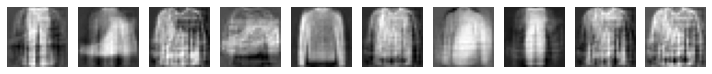

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


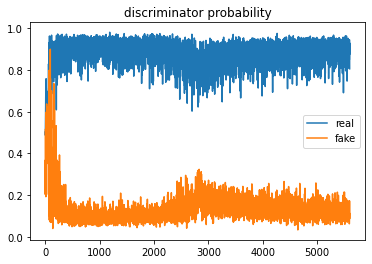

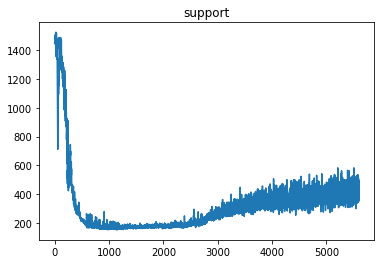

current support  478.0625


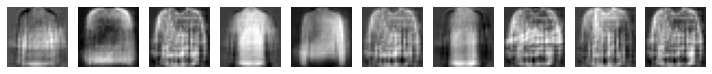

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


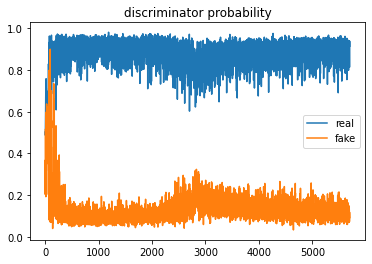

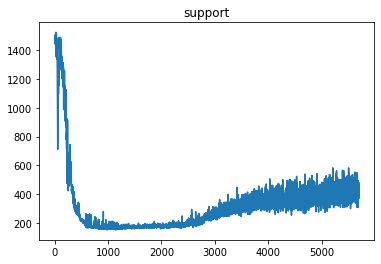

current support  451.5625


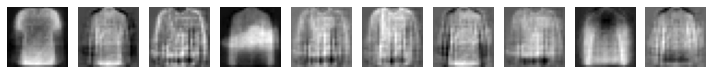

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


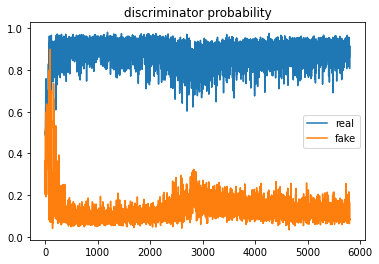

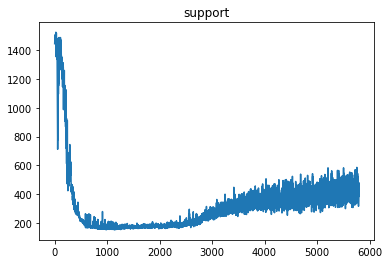

current support  414.3125


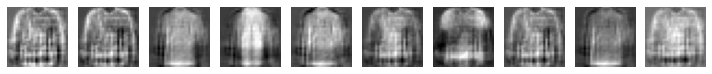

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


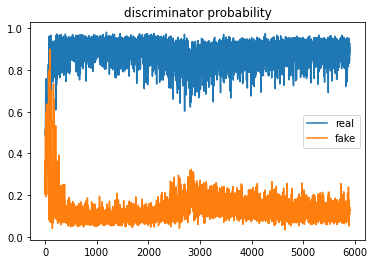

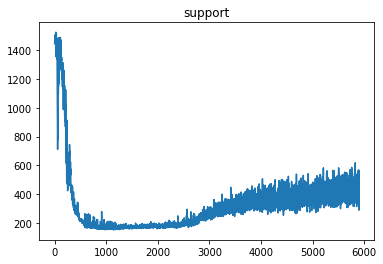

current support  399.8125


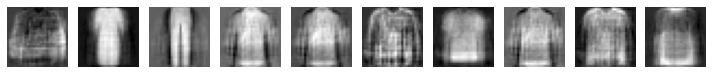

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


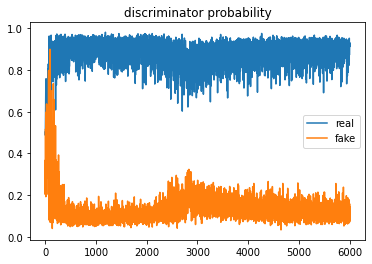

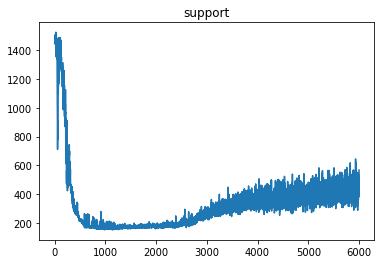

current support  568.0625


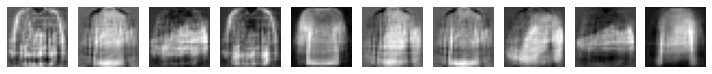

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


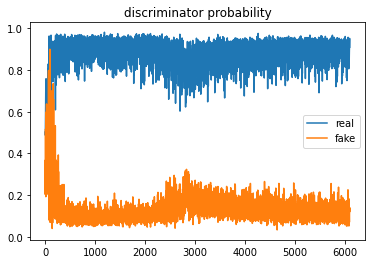

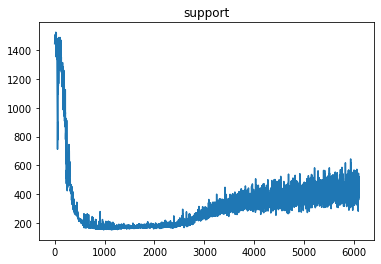

current support  383.375


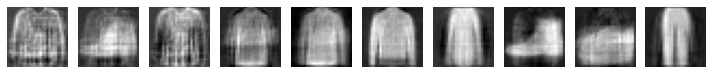

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


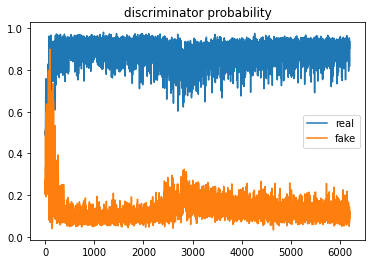

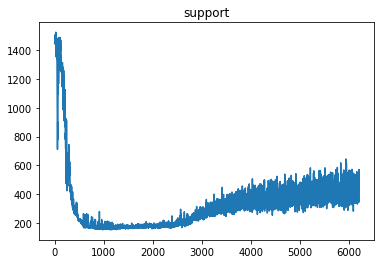

current support  415.8125


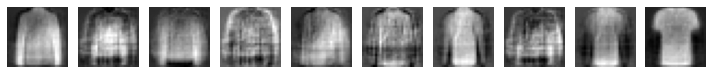

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


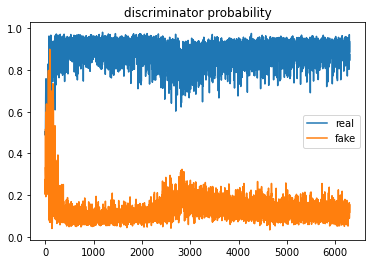

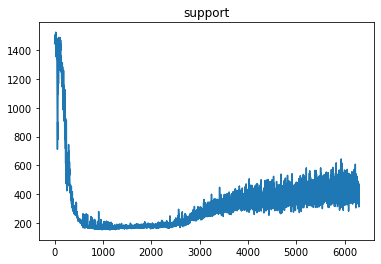

current support  433.75


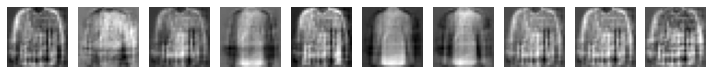

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


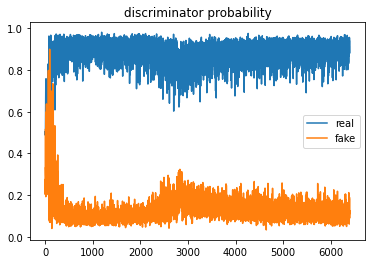

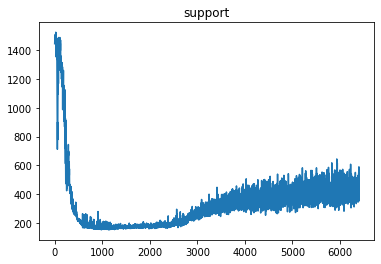

current support  458.25


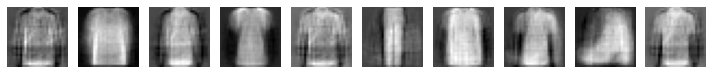

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


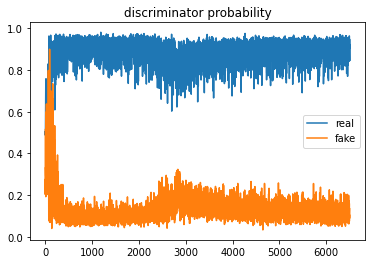

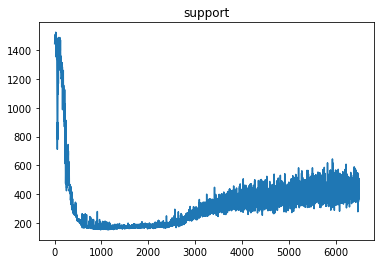

current support  483.3125


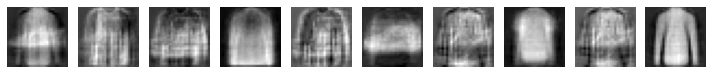

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


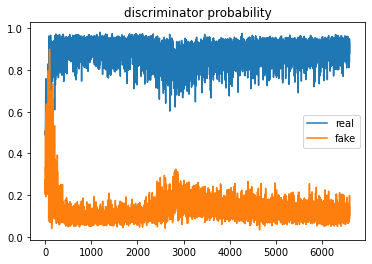

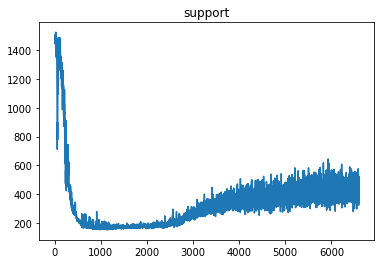

current support  494.0625


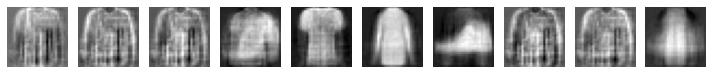

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


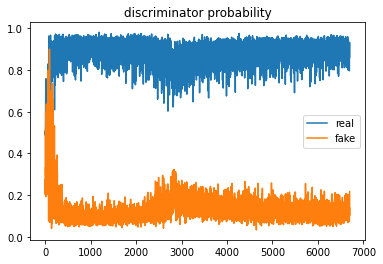

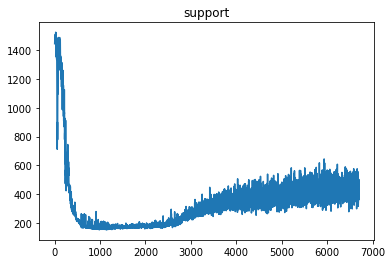

current support  488.3125


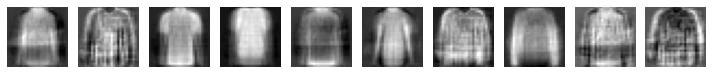

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


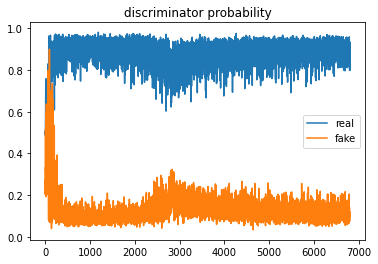

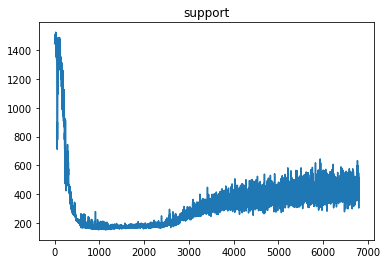

current support  481.875


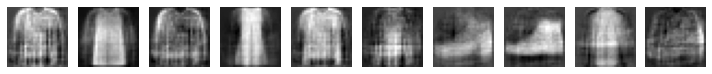

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


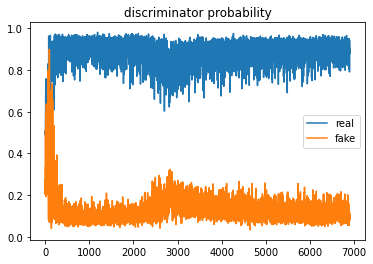

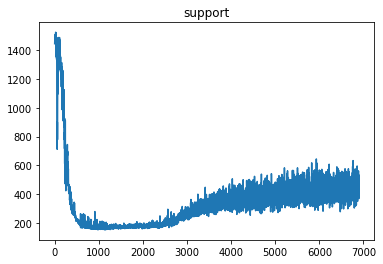

current support  428.625


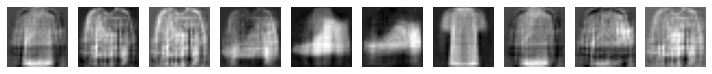

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


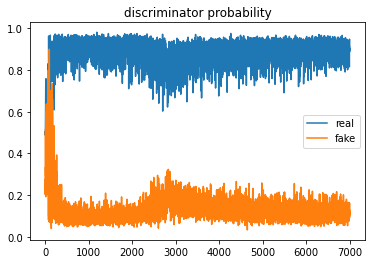

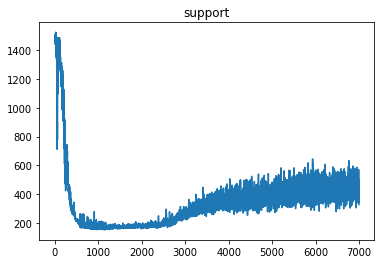

current support  328.3125


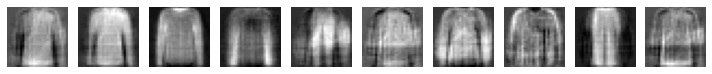

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


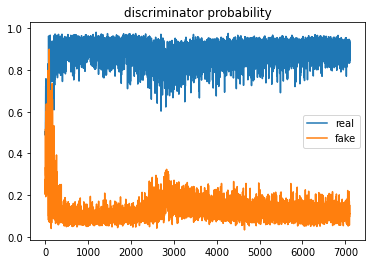

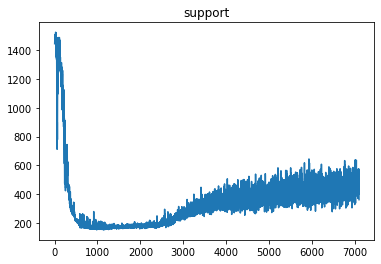

current support  361.9375


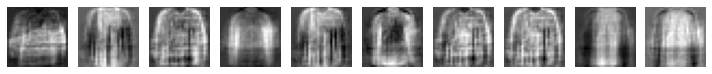

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


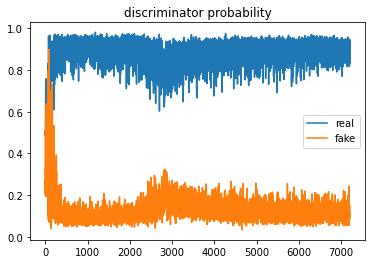

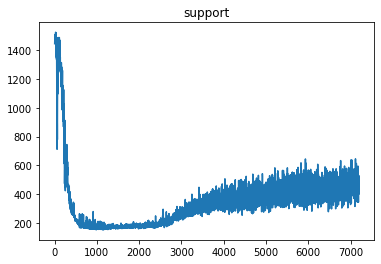

current support  489.0625


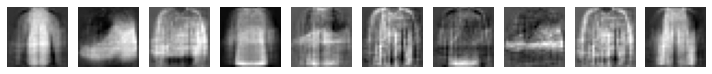

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


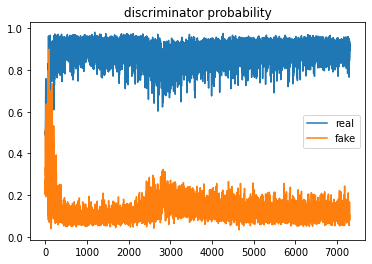

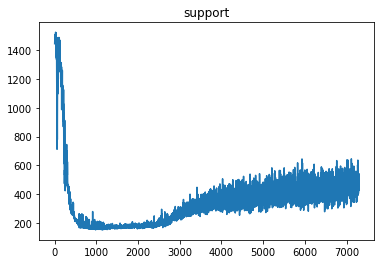

current support  541.5625


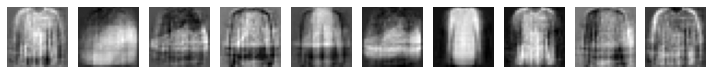

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


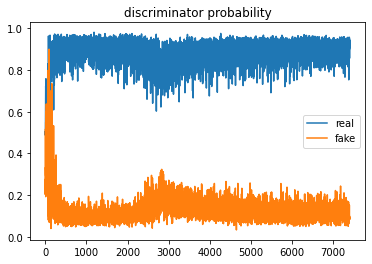

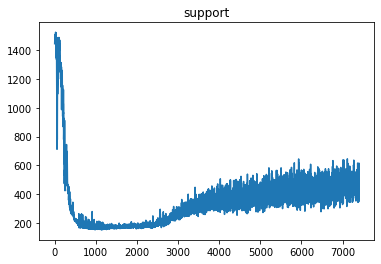

current support  482.6875


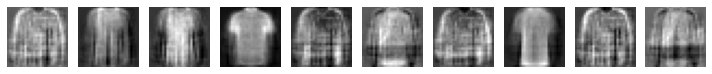

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


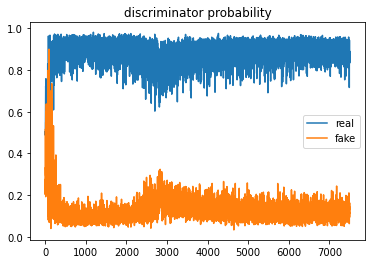

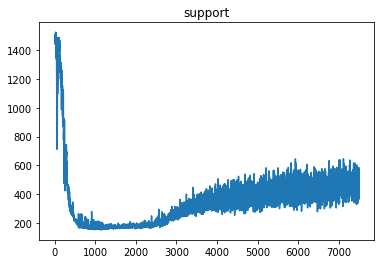

current support  416.5


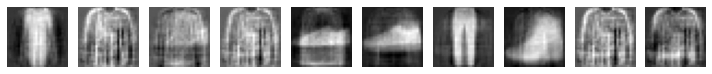

Epoch: 2 	 Discriminator Loss_fake: 0.316791832447052 	 Discriminator Loss_real: 0.4953494966030121		 Generator Loss: [1.0411819, 0.3677278, 0.053907353]


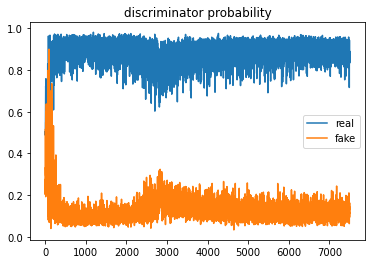

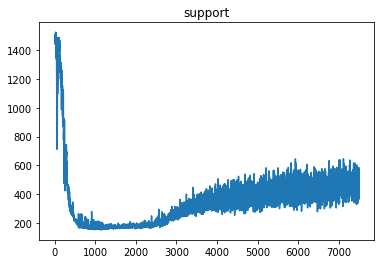

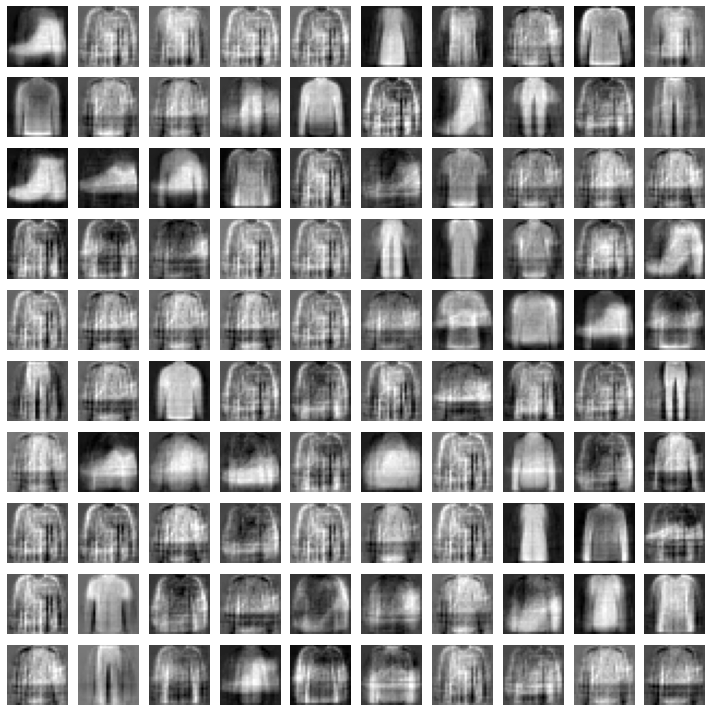

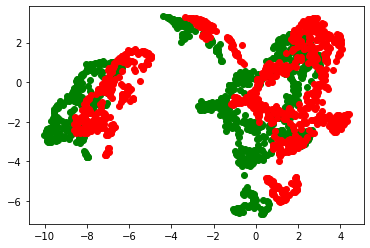

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


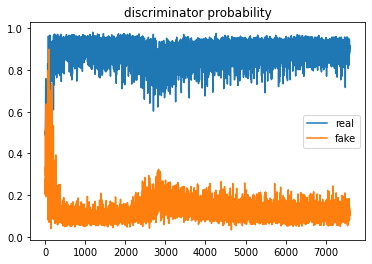

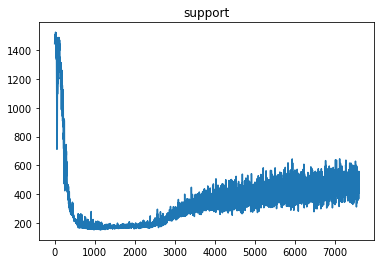

current support  471.875


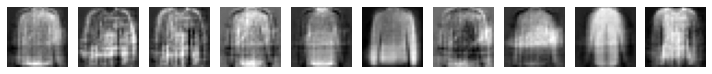

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


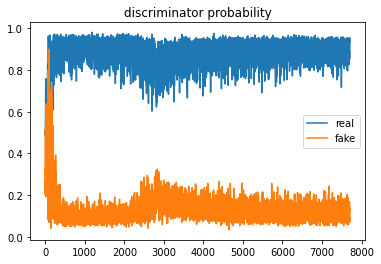

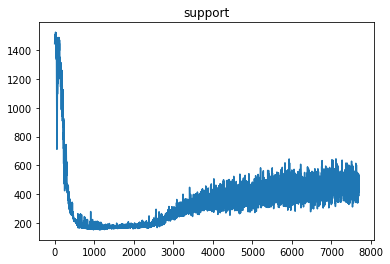

current support  422.6875


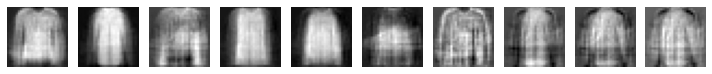

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


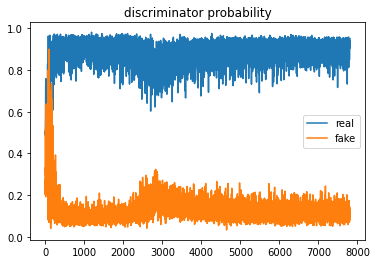

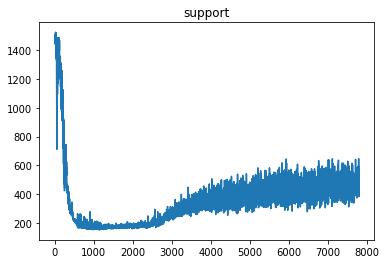

current support  415.125


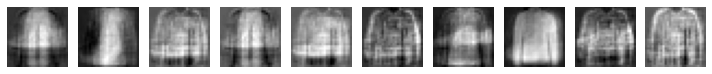

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


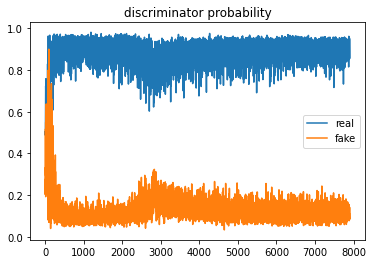

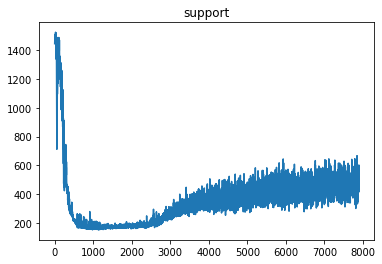

current support  546.9375


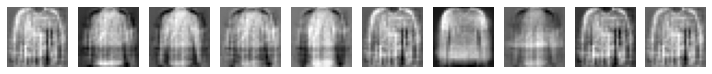

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


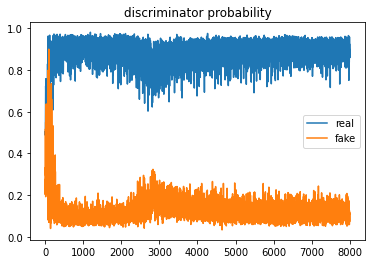

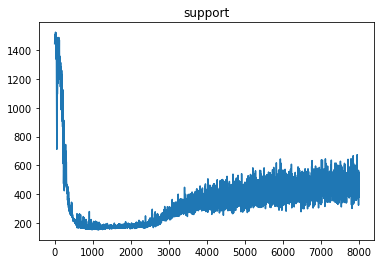

current support  547.5


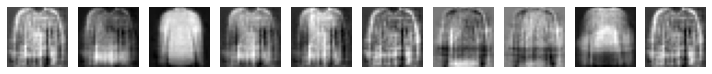

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


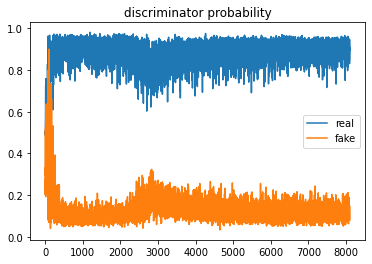

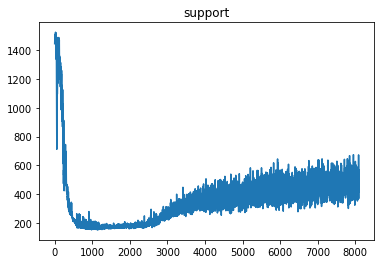

current support  569.0625


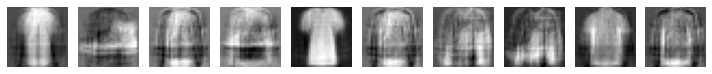

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


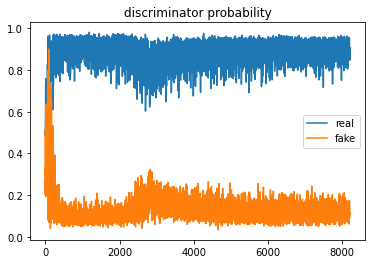

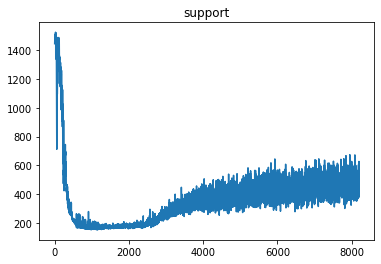

current support  492.0


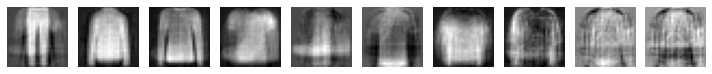

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


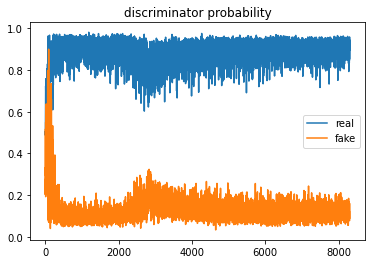

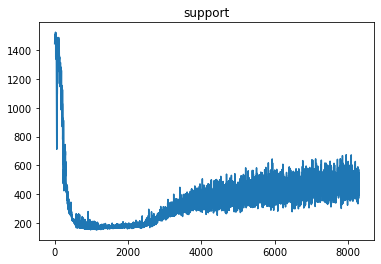

current support  375.5625


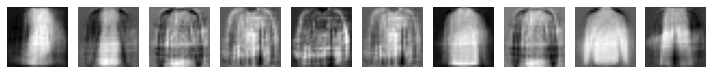

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


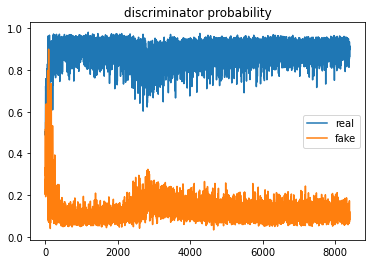

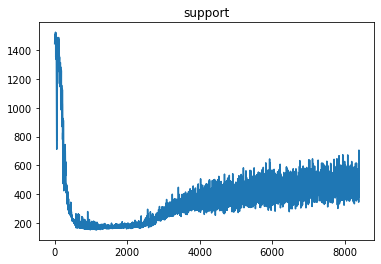

current support  499.9375


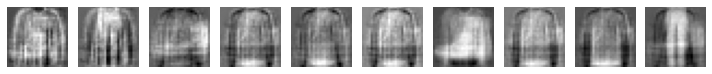

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


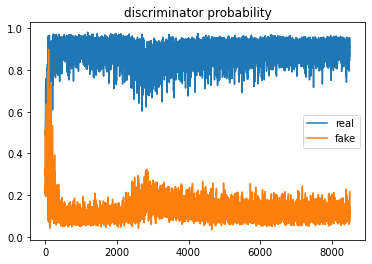

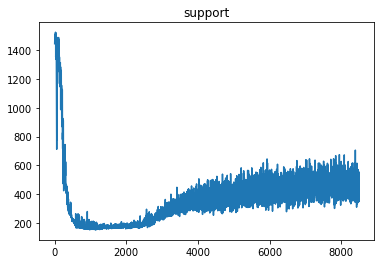

current support  500.75


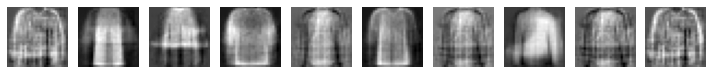

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


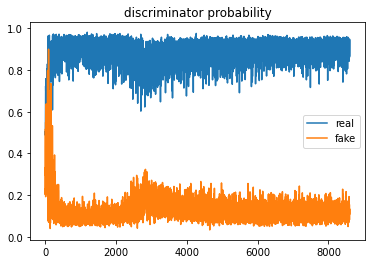

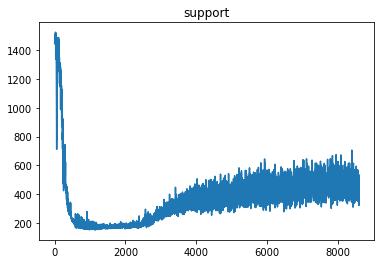

current support  439.4375


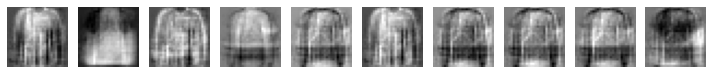

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


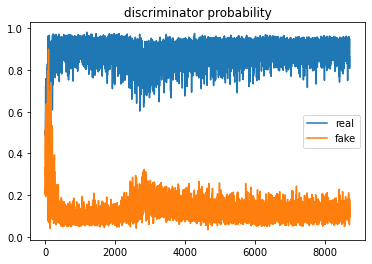

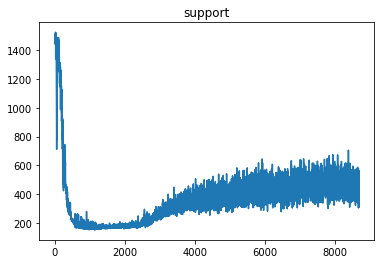

current support  562.8125


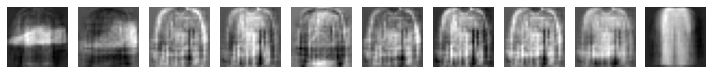

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


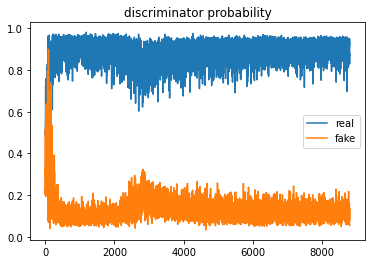

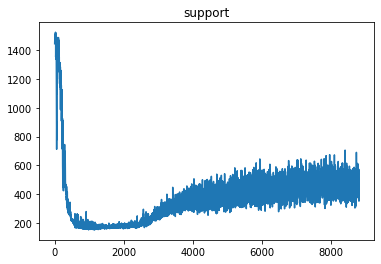

current support  419.375


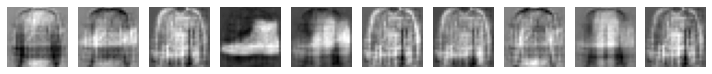

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


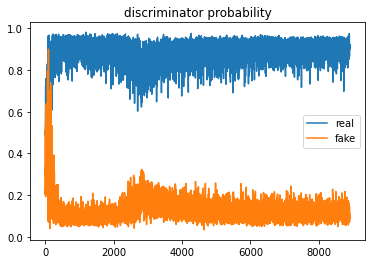

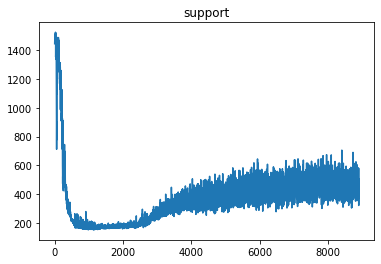

current support  441.125


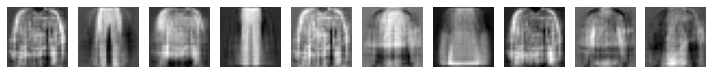

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


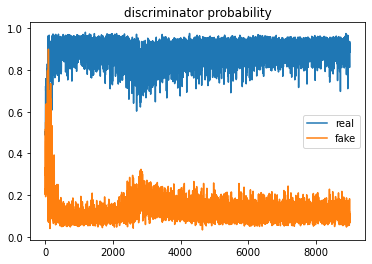

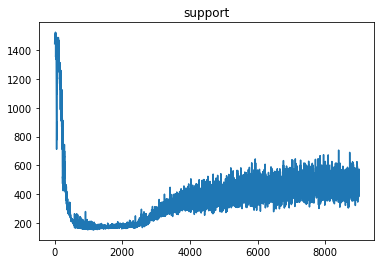

current support  446.25


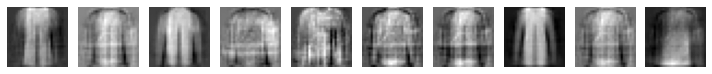

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


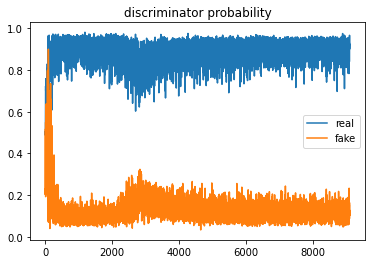

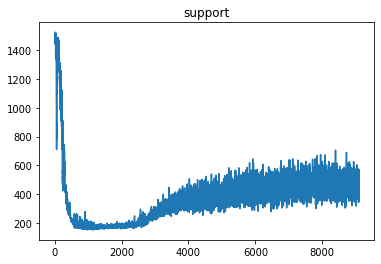

current support  479.6875


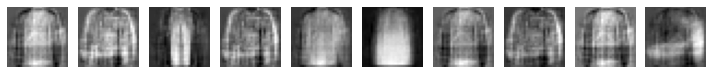

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


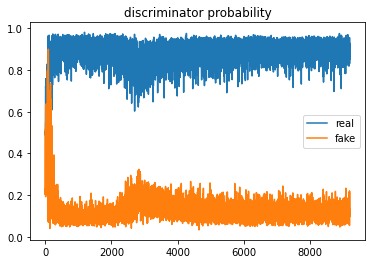

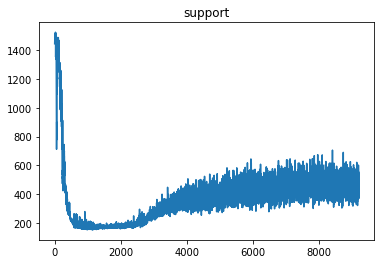

current support  414.625


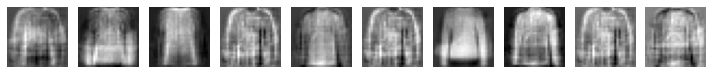

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


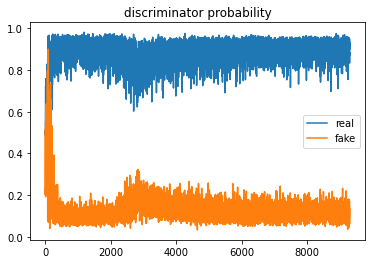

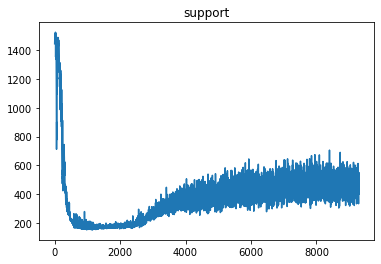

current support  481.375


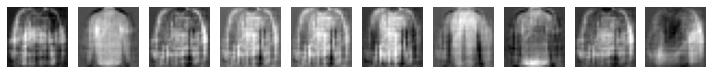

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


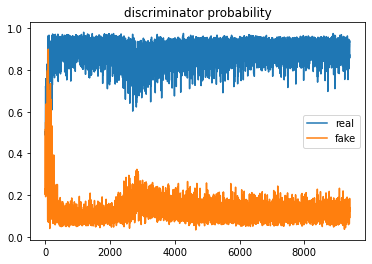

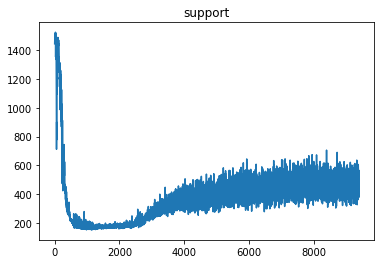

current support  456.625


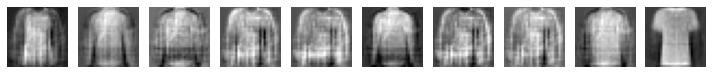

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


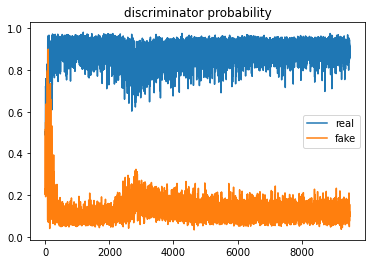

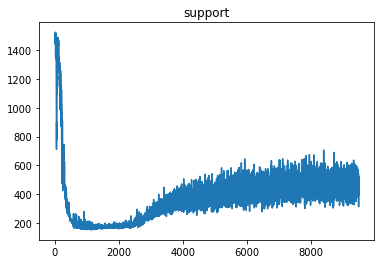

current support  453.5


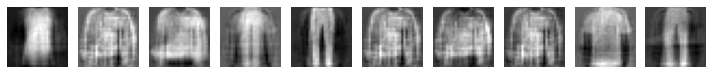

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


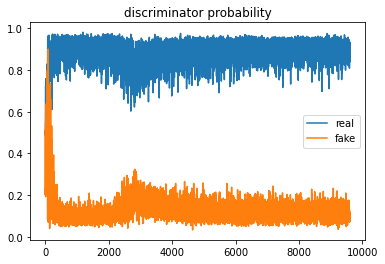

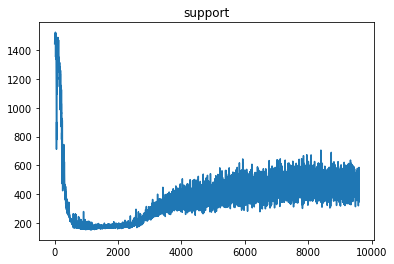

current support  417.0


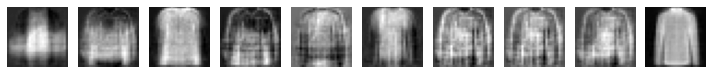

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


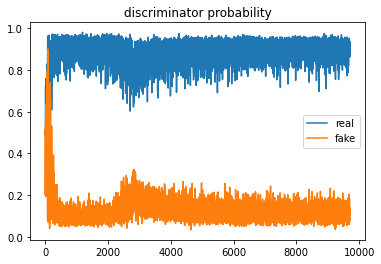

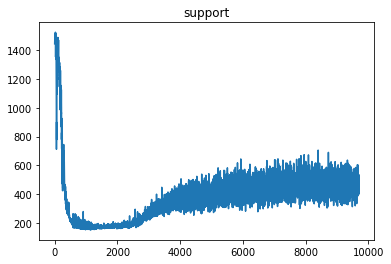

current support  485.875


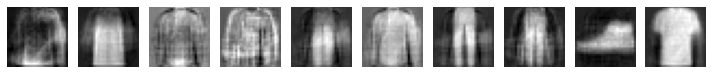

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


KeyboardInterrupt: ignored

In [7]:
from numpy.random import uniform
from sklearn.manifold import TSNE
import umap

def visualize_UMAP():
  plt.figure()
  plt.scatter(embedding[:,0],embedding[:,1],c="green")
  noise = np.random.normal(0, 1, size=(1000, noise_dim))
  g_pred = generator.predict(noise)
  reducer = umap.UMAP()
  embedding2 = reducer.fit_transform(real)
  plt.scatter(embedding2[:,0],embedding2[:,1],c="red")
  plt.show()

reducer = umap.UMAP()
real = x_train[0:1000,:]
embedding = reducer.fit_transform(real)



def visualize_TSNE(): 
  plt.figure()
  plt.scatter(tsne_data[:,0],tsne_data[:,1],c="green")

  noise = np.random.normal(0, 1, size=(1000, noise_dim))
  g_pred = generator.predict(noise)
  model2 = TSNE(n_components=2, random_state=0)
  tsne_fake_data = model.fit_transform(g_pred)
  plt.scatter(tsne_fake_data[:,0],tsne_fake_data[:,1],c="red")

  fake_x =generate_fake_samples(1000)
  d_pred = discriminator.predict(fake_x)
  fake_as_real = fake_x[d_pred>0.5]
  model3 = TSNE(n_components=2, random_state=0)
  tsne_fake_as_real_data = model.fit_transform(fake_as_real)
  plt.scatter(tsne_fake_as_real_data[:,0],tsne_fake_as_real_data[:,1],c="yellow")
  plt.show()

real = x_train[0:1000,:]
model = TSNE(n_components=2, random_state=0)
tsne_data = model.fit_transform(real)


def d_ratio_on_samples(x):
  return np.sum(discriminator.predict(x))/x.shape[0]

def generate_fake_samples(size):
  noise = np.random.normal(0, 1, size=(size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)    
  fake_x = generator.predict(noise) # create G(z)
  # fake is (size,sparse_dim)
  fake_x = np.transpose(fake_x)
  # multiply by dict
  fake_x = np.matmul(dictionary_loaded2,fake_x)
  fake_x = np.transpose(fake_x)
  if(not create_fc_d):
    fake_x = fake_x.reshape(size,img_rows,img_cols,channels)
  return fake_x

def generate_real_samples(size):
  real_idx = np.random.randint(0, x_train.shape[0], size=half_batch_size)
  real_x = x_train[real_idx] # sample real image
  real_x = real_x.reshape(fake_x.shape)
  return real_x

def plot_statistics(descriminator_real_probability, descriminator_fake_probability,support_arr):
  plt.figure()
  plt.title('discriminator probability')
  plt.plot(iters, descriminator_real_probability)
  plt.plot(iters, descriminator_fake_probability)
  plt.legend(['real', 'fake'])
  plt.show()
  plt.figure()
  plt.title('support')
  plt.plot(iters,support_arr)
  plt.show()


def update_training_scheme_params(descriminator_real_probability, descriminator_fake_probability, n_g, n_d, epoch):
  true_prob = np.average(descriminator_real_probability[-50:])
  fake_prob = np.average(descriminator_fake_probability[-50:])
  delta = np.abs(true_prob - fake_prob) 

  if(delta <= 0.05):                # converged!
    return True,int(n_g), int(n_d)
  elif(delta>0.3):
    return False, 20, 1
  elif(delta<=0.3 and delta>=0.15):
    return False, 5, 10
  else:
    return False, 5, 20

def contrast_strech(image):
  image = 255*(image - np.min(image))/(np.max(image)-np.min(image))
  return image

def show_images(noise):
    generated_images = generator.predict(noise)
    generated_images = np.matmul(dictionary_loaded2,np.transpose(generated_images))
    generated_images = np.transpose(generated_images)
    plt.figure(figsize=(10, 10))
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        #image = contrast_strech(image)
        if channels == 1:
            plt.imshow(image.reshape((img_rows, img_cols)), cmap='gray')
        else:
            plt.imshow(image.reshape((img_rows, img_cols, channels)))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def get_support_size(sparse_tensor):
  sparse_tensor = np.array(sparse_tensor)
  # num of non zeros in all batch / batch size
  return np.count_nonzero(sparse_tensor) /sparse_tensor.shape[0]

descriminator_real_probability = np.array([])
descriminator_fake_probability = np.array([])
support_arr = np.array([])
iters= np.array([])

# training amount params
n_d = 20
n_g = 20
n_r = 0
if(use_fashion):
  n_d = 20
  n_g = 5
  n_r = 0
i = 0
support = 0
converged = False

for epoch in range(epochs):  #epochs
  for iter in range(int(steps_per_epoch)):
    i += 1
    # train D
    for batch in range(n_d):  #steps_per_epoch
        fake_x = generate_fake_samples(half_batch_size)
        # fake_x is of size (half_batch_size,rows,cols,channels)
        disc_y_fake = uniform(0,0.1,half_batch_size)
        # train_on_batch recieves data and desired output
        d_loss_fake = discriminator.train_on_batch(fake_x, disc_y_fake)
        real_x =generate_real_samples(half_batch_size)
        disc_y_real = uniform(0.9,1.0,half_batch_size)
        # train_on_batch recieves data and desired output
        d_loss_real = discriminator.train_on_batch(real_x, disc_y_real)

    ######################################################### train G ###############################################################
    for batch in range(n_g):  #steps_per_epoch
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
        support = get_support_size(generator.predict(noise))
        # train GAN (descriminator weights are fixed)
        y_gen_1 = uniform(0.9,1,batch_size)
        y_gen_2 = np.zeros(batch_size * sparse_dim)
        y_gen_2_reshape = y_gen_2.reshape(batch_size,sparse_dim)
        g_loss = gan.train_on_batch(noise, [y_gen_1, y_gen_2_reshape])

    ######################################################### train R ##############################################################
    for batch in range(n_r):  #steps_per_epoch
      rand_idxs = np.random.randint(0, x_train.shape[0], size=64)
      x = x_train[rand_idxs] # sample real transformed image
      # trans_x = transformed_x[rand_idxs]
      # zeros = np.zeros(64*noise_dim)
      # zeros = zeros.reshape(64,noise_dim)
      # #labels = [zeros,x]
      # labels = x
      # r_loss = vae.train_on_batch(trans_x,labels)
      variational_autoencoder.fit(x,epochs=1,batch_size=16,verbose=0)

    ########################################################## statistics ##########################################################       

    real_data = generate_real_samples(batch_size)
    fake_data = generate_fake_samples(batch_size)
    noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
    support = get_support_size(generator.predict(noise))
    # append to statistics array
    descriminator_fake_probability = np.append(descriminator_fake_probability ,d_ratio_on_samples(fake_data))        
    descriminator_real_probability = np.append(descriminator_real_probability ,d_ratio_on_samples(real_data))
    support_arr = np.append(support_arr, support)        
    iters =  np.append(iters,i)

    ########################################################## visualize ########################################################## 

    if(i%100==0):
      plot_statistics(descriminator_real_probability, descriminator_fake_probability,support_arr)
      noise = np.random.normal(0, 1, size=(10, noise_dim))
      print("current support ",support)
      show_images(noise)

    ########################################################## training scheme updates #############################################

    # if(i%100==0):
    #   converged , n_g, n_d = update_training_scheme_params(descriminator_real_probability, descriminator_fake_probability, n_g, n_d, epoch)
    #   print("n_g was updated to ",n_g, " n_d to ",n_d)
    #   if(converged):
    #     print("Converged!")
    #     break

  print(f'Epoch: {epoch + 1} \t Discriminator Loss_fake: {d_loss_fake} \t Discriminator Loss_real: {d_loss_real}\t\t Generator Loss: {g_loss}')
  plot_statistics(descriminator_real_probability, descriminator_fake_probability,support_arr)

  noise = np.random.normal(0, 1, size=(100, noise_dim))
  show_images(noise)
  visualize_UMAP()
  if(converged):
    break
  